# **Cryospheric Climate Modelling Using Multimodal Satellite Images**
### by Souraja Kundu (210102103)

### **Motivation:**
Exploring multimodal learning with practical use cases is always fascinating! One of the most prominent global challenges today is climate change. Ironically, training advanced deep learning models itself contributes to carbon emissions. So, why not use artificial intelligence to aid climate change prevention? A first step in this direction is the monitoring and analysis of cause-and-effect relationships in the changing climate. So, this project's broad goal is climate modelling. Among the various components of climate systems (e.g., ocean level, atmospheric content, land surface coverage), I have focused on the cryosphere, which means the Earth's frozen regions.

As temperature and humidity levels rise, snow in glacial and high-altitude regions begins to melt. Seasonal snowmelt is expected. However, the concerning fact is that even in the same month of the season, over the years, the amount of snow-covered area gradually decreases. A key research question here is: Can we identify which climate parameter changes contribute most significantly to this decline in snow cover? To answer this, we need to accurately detect snow cover from satellite imagery. 

An analysis of different satellite imaging modalities shows that the Synthetic Aperture Radar (SAR) images are the most effective in having high-resolution images even in the presence of cloud cover or during nighttime because of the frequency band used. So, some more research questions come up, like, given a SAR image, can we find the snow-covered area? Or, can we predict key climate variables like temperature or snow depth directly from SAR imagery? Addressing these questions requires a dataset that includes SAR images, annotated snow cover, and corresponding climate data.

### **Impact:**
To monitor snow cover dynamics to assess the impact of climate change, forecast water availability, and manage disaster risk.



### **Objectives:**
1) For mountainous regions in the Global South, particularly the Indian Himalayas, no comprehensive public dataset exists. Moreover, such a dataset must be multimodal, consisting of various frequency bands (SAR, Near Infrared (NIR), Short-Wave Infrared (SWIR), and RGB) along with paired numerical climate variables. Therefore, my initial goal was to curate a large-scale dataset consisting of matched sets of {SAR image, RGB image, snow mask, weather parameters} spanning various locations across the Indian Himalayas from 2014 to 2024.

2) SAR images are inherently contaminated with speckle noise due to the acquisition process. So, the next goal is to despeckle the SAR images. For the majority of this semester, I did several experiments on this subgoal and submitted the following paper:
[IEEE TGRS Under Review Paper Link](https://drive.google.com/file/d/1Ae-vSR4iFNa5nopbZGmVk3RPXtZpjtcR/view?usp=sharing)

3) Create snow cover ground truths or masks using the different frequency bands available in satellite data. I compared the Normalised Difference Snow Index (NDSI) and Normalised Difference Fractional Snow Index (NDFSI) for creating the snow masks.

4) Segmentation of snow covers in SAR images with the snow cover ground truths derived from the optical images.

5) Scatter plot of each climate parameter with the snow-covered area, reflecting on the correlation. Also, I will try to predict the climate parameters using a linear regression model after segmenting a test SAR image and calculating its snow-covered area.

### **My Learning From This Work**

1. This project has been a good chance for me to explore the recent advances in multimodal learning (VLM, LLM, LMM) as much as I want. I could thoroughly read some good papers and online blogs (mentioned in the reference section at the end), as I could spend all of my waking hours for four days after the end of the semester just for this project. This project has personal relevance for me as I start my **Machine Learning Ph.D. at CMU this Fall 2025, focusing on multimodal learning and Computer Vision**. This was also a chance to *code* to use multimodal pre-trained models, analyse their architecture, use the Hugging Face library, and learn from failure. I especially enjoyed reading articles from [https://distill.pub/](https://distill.pub/) as I was very fascinated by some new concepts like [multimodal neuron](https://distill.pub/2021/multimodal-neurons/) and [differentiable image parameterisations](https://distill.pub/2018/differentiable-parameterizations/).

2. This was the first time I single-handedly collected, curated and pre-processed a significantly huge dataset from different resources. Searching for the appropriate resource was indeed time-consuming and was finalised after multiple failed experiments with different resources. Finally, I plan to open-source this curated dataset when I submit my journal to IEEE TGRS.

3. This is also my first project on Satellite imaging, so I had to learn multiple new terminologies and domain-specific concepts. For easy reference, I have presented them very precisely in the beginning.

### **Relation with Content Taught in Class**

1. The concept that dataset collection is not dataset curation that Sir told us in class is proven true. After curation, the dataset size was reduced to only one-third.

2. Feature map/ activation map visualisation after each layer of any kind of CNN network. I experimented with pre-trained models like CLIP, Dinov2, and DeepLabV3.

3. Linear regression was extensively taught in class. I reduced the multimodal problem to multiple linear regression problems for climate modelling. I could predict important and interesting insights based on the regression results.

4. Dimensionality reduction using PCA was another topic extensively taught in class. Here, I tried to reduce the dimensionality of CLIP embeddings in a 2D plot using PCA and derived an interesting conclusion about the domain mismatch between SAR and RGB images.

5. One thing I learned from Sir is to be extremely curious and explore things in depth. This project overall is a showcase of that learning and effort.

### *Related Works*

In this project, multimodality is currently limited to the use of multimodal satellite images—specifically, different frequency bands such as optical and SAR. These complementary modalities are used to estimate snow-covered areas more accurately. Once the snow extent is determined, the task of predicting climate variables reduces to a standard regression problem. However, there is potential to extend this work into a more interactive multimodal framework. For example, given a temporal stack of SAR and RGB satellite images, one could explore the possibility of answering climate-related questions posed in natural language. This would relate to multi-image question answering and Large Multimodal Models (LMMs), which aim to unify vision and language understanding, a bit closer to artificial general intelligence. However, my goal is to keep this project *original, simple, yet reveal some impactful insights*. Since such multimodal extension is beyond the intention of this project, I include a brief discussion on LMMs and multi-image question answering in this literature review section to highlight the future potential of this research direction. This discussion will also be relevant when I try to visualise the image features extracted from SAR and RGB images in the segmentation model using a Vision Language Model's (VLM) image encoder. After this, a dedicated subsection will review prior work specifically related to multimodal satellite image analysis.

#### *Multimodal Learning*
This subsection is to explain my point of view on VLMs and LMMs. VLMs integrate computer vision and natural language processing to perform tasks such as image captioning, visual question answering (VQA), and image-text retrieval. They generally contain a CNN or Vision Transformer-based image encoder, a BERT or GPT-based text encoder, a multimodal feature fusion module, mostly using cross-attention, to integrate visual and textual embeddings into a unified representation, and finally a decoder to generate outputs (e.g., captions) based on the fused representation. 

The first use case of VLM in this project that comes to my mind is extracting image features using the vision side of a powerful pre-trained VLM or LMM. Since these models are trained with language and other modalities' understanding, their vision part can extract more meaningful features. I used Contrastive Language-Image Pretraining (CLIP)-extracted visual features, and will discuss CLIP later in more detail. There are more VLMs that are popular; I briefly summarise them in the following table:

| Model          | Key Features                                                                                          |
| -------------- | ----------------------------------------------------------------------------------------------------- |
| **CLIP** [1]      | Dual-encoder model trained on 400M image-text pairs using contrastive learning.                       |
| **ALIGN** [2]     | Similar to CLIP but trained on larger datasets with noisy text annotations.                           |
| **ViLT** [3]     | Simplifies architecture by removing CNNs, directly applying transformers to image patches and text.   |
| **VisualBERT** [4] | Integrates visual and textual information through a unified transformer architecture.                 |
| **SimVLM** [5]    | Employs a simple transformer architecture with prefix language modelling for both vision and language. |



### **Some Interesting Conclusions**

1. As temperature (both min and max) decreases, snow cover increases.
2. As precipitation and snowfall amount increase, snow cover increases.
3. As humidity decreases, snow cover increases.
4. Just 10 years of data are too few to predict climate change. The fact is that the maximum temperature has risen only slightly over the years. But it has indeed increased with time. And from the last plot, we saw that with temp, snow cover changes significantly. One more observation is that in winter and fall, the snow cover has indeed decreased over the years, though very slightly.


5. The CLIP embeddings of SAR and RGB in the reduced dimensional feature space are just a translated (shifted version) of each other. So, I could identify the nature of the domain mismatch clearly. RGB images capture visible light with fine-grained textures and colours, while SAR captures backscattered microwave signals, sensitive to surface roughness, structure, and dielectric properties. My subsequent research can be to compensate for this domain mismatch by projecting into this shared embedding space. And after that, we can use the snow mask derived from the aligned/registered RGB image as the ground truth to segment the SAR image. 



LMM extends VLM's capability by handling broader datasets of multiple modalities like audio, text, image, 3d data/point clouds, satellite data, climate data, time series data, etc. LMMs also follow a similar structure to VLMs - a multimodal encoder, a fusion mechanism and a unified decoder. So, my final model will be an LMM, since its overall input training data will be SAR images, optical masks, and climate time series data, its test input data will be a  SAR image, and the test output will be climate parameters. There are some popular LMMs, as I summarised below. Also, Llama 3.2-Vision is built on top of a pre-trained Llama 3.1 text-only model, so Llama 3.2 is multimodal. I tried experimenting with it for the visual question answering task following this article [6]. I gave a SAR image and asked different climate-related questions. 

| Model            | Key Features                                                                                              |
| ---------------- | --------------------------------------------------------------------------------------------------------- |
| **Flamingo** [7]     | Combines a frozen vision encoder with a language model using cross-attention, enabling few-shot learning. |
| **GPT-4o** [8]     | OpenAI's multimodal model capable of processing and generating text, images, and audio.                   |
| **LLaVA** [9]       | Integrates CLIP with LLaMA, enabling visual instruction tuning.                                           |
| **ConvLLaVA** [10]   | Replaces ViT with ConvNeXt as the visual encoder to handle high-resolution images efficiently.            |
| **DeepSeek-VL2** [11] | Employs a mixture-of-experts architecture with separate adapters for vision and language modalities.      |


#### *Multimodal Satellite Image Analysis*

Different modality/frequency band satellite data are often necessary because the visibility of different objects of interest is better for different bands. Contrastive learning approaches have been applied to remote sensing by treating images from different sensors (e.g., Sentinel-1 SAR and Sentinel-2 optical) as positive pairs for flood segmentation and land cover mapping [12]. The work in [13] used two colour spaces, RGB and YCbCr, for avalanche debris detection using Sentinel-2 multispectral satellite data for a part of the Indian Himalaya. There are some multimodal satellite datasets available, like SEN12-Flood, combining Sentinel-1 and Sentinel-2 images for flood detection, providing multimodal time series data [14], and multimodal remote sensing benchmark datasets designed for land cover classification using shared and specific feature learning models [15]. Compared to these previous works, our project is novel/original from many aspects, including problem statement, dataset, methodologies, etc.



### **A Few Preliminaries**
| Band     | Wavelength Range | Frequency Range | Description                                                        |
| -------- | ---------------- | --------------- | ------------------------------------------------------------ |
| **RGB**  | 400–700 nm       | \~430–750 THz   | Visible light (Red-Green-Blue)                               |
| **NIR**  | 700–1400 nm      | \~215–430 THz   | Near-Infrared (just beyond visible red)                      |
| **SWIR** | 1400–3000 nm     | \~100–215 THz   | Short-Wave Infrared, used in thermal and vegetation analysis |
| **L-band** | 15–30 cm         | 1–2 GHz         | Penetrates vegetation, soil—good for biomass and forest    |
| **S-band** | 7.5–15 cm        | 2–4 GHz         | Moderate vegetation penetration                            |
| **C-band** | 3.75–7.5 cm      | 4–8 GHz         | Used in Sentinel-1; good for snow, ice, and soil moisture  |



In the above table, the L, S, and C-bands are present in SAR images. I used the Copernicus Sentinel-1 C-band SAR images for snow's better visibility in such images. SAR images have the following bands:

| **Polarization** | **Transmitted (Tx)** | **Received (Rx)** | **Type**        | **Common Use Cases**                                      |
| ---------------- | -------------------- | ----------------- | --------------- | --------------------------------------------------------- |
| **HH**           | Horizontal           | Horizontal        | Co-polarized    | Surface roughness, ocean/sea ice, structural features     |
| **HV**           | Horizontal           | Vertical          | Cross-polarized | Vegetation, volume scattering (e.g., forests)             |
| **VH**           | Vertical             | Horizontal        | Cross-polarized | Similar to HV, used for vegetation and complex scatterers |
| **VV**           | Vertical             | Vertical          | Co-polarized    | Water bodies, snow, soil moisture, smoother surfaces      |


I used the VV polarisation because of its better resolution of snow.


I used LANDSAT-8 optical images. As shown above in the code, B3 is the Green band, B5 is the NIR band, and B6 is the  SWIR band in the LANDSAT satellite data. For snow cover detection from optical images, I used two snow indices as follows:

**NDSI:** NDSI is a spectral index used to detect snow cover using the difference in reflectance between green and SWIR bands of optical images.

$NDSI = \frac{Green − SWIR}{Green + SWIR}$


In [10]:
# Function to return the image with an NDSI band appended
def addmNDSI(image):
  Green=image.select('B3')
  SWIR=image.select('B6')
  mNDSI=image.expression('((B3-B6)/(B3+B6))',{'B3':Green,'B6':SWIR}).rename('mNDSI')
  image=image.addBands(mNDSI)
  return image

**NDFSI:** This index detects snow cover using the difference in reflectance between green and SWIR bands of optical images, allowing for better discrimination in mixed pixels (e.g., snow + vegetation or soil).

$NDFSI = \frac{NIR − SWIR}{NIR + SWIR}$

In [11]:
# Function to return the image with a mNDFSI band appended
def addmNDFSI(image):
  NIR=image.select('B5')
  SWIR=image.select('B6')
  mNDFSI=image.expression('((B5-B6)/(B5+B6))',{'B5':NIR,'B6':SWIR}).rename('mNDFSI')
  image=image.addBands(mNDFSI)
  return image

### **Dataset Collection**

The SAR and Optical images were collected from [Google Earth Engine](https://earthengine.google.com/). One can code in Python or Java to extract data from this engine. I used Python for my convenience. I followed [this tutorial](https://github.com/RituAnilkumar/EarthEngine/blob/master/Exercise2_multispectral_analysis.ipynb) to learn how to use Google Earth Engine.

In [1]:
import ee
ee.Authenticate()
ee.Initialize()

After authenticating our Google account, we can start by specifying the desired location (here, near the Karakoram mountains), satellite name and bands. One has to carefully choose the min and max value of the range that will be linearly scaled to display the image.

In [16]:
loc=ee.Geometry.Point(74.548, 35.321)

In [3]:
im_col=ee.ImageCollection('COPERNICUS/S1_GRD').filterBounds(loc).filterDate(ee.Date('2023-01-01'),ee.Date('2023-12-31'))
num_im=im_col.size()
print(num_im.getInfo())

115


In [5]:
im_col=im_col.sort('CLOUDY_PIXEL_PERCENTAGE',True)
num_im=im_col.size()
print(num_im.getInfo())

115


In [7]:
im=im_col.first()

In [8]:
from IPython.display import Image
Image(url=im.getThumbUrl({'min': -25, 'max': 5, 'dimensions': 512, 'bands':['VV']}))

In [12]:
im_col = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') \
    .filterBounds(loc) \
    .filterDate('2023-01-01', '2023-12-31')
im = ee.Image(im_col.first())
print('Bandnames of the original image are:', im.bandNames().getInfo())

# Add mNDSI band
mNDSI_im = addmNDSI(im)
print('Bandnames of the image with added mNDSI are:', mNDSI_im.bandNames().getInfo())

Bandnames of the original image are: ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'QA_PIXEL', 'QA_RADSAT', 'SAA', 'SZA', 'VAA', 'VZA']
Bandnames of the image with added mNDSI are: ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'QA_PIXEL', 'QA_RADSAT', 'SAA', 'SZA', 'VAA', 'VZA', 'mNDSI']


As I know from class that human eyes are the most sensitive to Green colour, so I first plotted the green intesity map of a LANDSAT image. As I can see, this image has significant amount of cloud coverage. This is the major problem even for snow-cover mask generation.

In [13]:
Image(url=im.getThumbUrl({'min': 0, 'max': 1, 'dimensions': 512, 'palette':['black','white'], 'bands':['B2']}))

It is not possible to visualise more than one band using the PIL Image library, so folium and geehydro libraries are used to visualise the RGB map as I did next.

In [46]:
!pip install geehydro

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
  Created wheel for geehydro: filename=geehydro-0.2.0-py2.py3-none-any.whl size=10124 sha256=75204d0e5bd7d6071297c5ba59a5d993779f213812249f8cdf70dad78cfc80f3
  Stored in directory: /home/dell/.cache/pip/wheels/cc/f0/c8/f761318de15d20d46693d576710a46d56b7bd9ba15249800e7
Successfully built geehydro

[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [18]:
import folium
import geehydro

Map = folium.Map(location=[74.548, 35.321], zoom_start=10)
Map.setOptions('SATELLITE')

rgb_vis = {
    'bands': ['B4', 'B3', 'B2'],  # RGB
    'min': 0.0,
    'max': 0.3,
}

Map.addLayer(im, rgb_vis, 'Landsat 8 RGB')
Map.add_child(folium.LayerControl())
Map


In [19]:
mNDSI=mNDSI_im.select('mNDSI')
mask_im=mNDSI.lte(0.22)
Image(url=mask_im.getThumbUrl({'min': 0, 'max': 1, 'dimensions': 512, 'palette':['black','white']}))

In [20]:
# Calling the function
print('Bandnames of the original image are',im.bandNames().getInfo())
mNDFSI_im=addmNDFSI(im)
print('Bandnames of the image with added mNDFSI are',mNDFSI_im.bandNames().getInfo())

Bandnames of the original image are ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'QA_PIXEL', 'QA_RADSAT', 'SAA', 'SZA', 'VAA', 'VZA']
Bandnames of the image with added mNDFSI are ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'QA_PIXEL', 'QA_RADSAT', 'SAA', 'SZA', 'VAA', 'VZA', 'mNDFSI']


In [21]:
mNDFSI=mNDFSI_im.select('mNDFSI')
mask_im=mNDFSI.lte(0.22)
Image(url=mask_im.getThumbUrl({'min': 0, 'max': 1, 'dimensions': 512, 'palette':['black','white']}))

In the masks, the black pixels are snow and the white pixels are non-snow. As I can see, the NDFSI mask has less white pixels than NDSI. It also looks smoother and more continuous than NDSI mask. Hence, I can conclude NDSI mask is noisier than NDFSI and hence I will use NDFSI mask as snow cover ground truth. Also, note that, due to the specifc bands used in creating these masks, the effect of cloud cover has reduced. 

### **SAR Despeckling**
The following code snippet was used to collect SAR images for training and testing the SAR despeckling model. I intend not to discuss this work in detail in this particular notebook just to limit its length. However, I did share all the codes in the GitHub repo, the README file has all the details, and [this](https://drive.google.com/file/d/1Ae-vSR4iFNa5nopbZGmVk3RPXtZpjtcR/view?usp=sharing) is the link to the paper which has all the details.

In [44]:
import ee
import os
import requests
import numpy as np
from PIL import Image
from io import BytesIO

def create_folder(folder_path):
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)

def download_sar_image(image, idx, base_path, loc):
    
    # aoi = ee.Geometry.Point([74.548, 35.321]).buffer(10000)  # 10 km buffer
    # aoi = ee.Geometry.Point(85.548, 25.321)
    half_side = 10000  # 10 km in each direction

    aoi = ee.Geometry.Rectangle([
        loc[0] - (half_side / 111320),  # Min Lon
        loc[1] - (half_side / 111320),  # Min Lat
        loc[0] + (half_side / 111320),  # Max Lon
        loc[1] + (half_side / 111320)   # Max Lat
    ])


   
    sar_image = image.select(['VV']).clip(aoi)

   
    sar_url = sar_image.getThumbURL({
        'min': -25, # (dB scale)
        'max': 5  # Set an upper bound for intensity normalization
    })


    response = requests.get(sar_url)
    image_data = Image.open(BytesIO(response.content))

  
    img_path = os.path.join(base_path, f'SAR_Image_{idx+132}.png')
    image_data.save(img_path, 'PNG')

    print(f"Downloaded SAR Image {idx}.")

loc = [75.348, 37.221]

# im_col = ee.ImageCollection('JAXA/ALOS/PALSAR-2/Level2_2/ScanSAR') \
im_col = ee.ImageCollection('COPERNICUS/S1_GRD') \
    .filterBounds(ee.Geometry.Point(loc)) \
    .filterDate(ee.Date('2014-01-01'), ee.Date('2024-12-31')) \
    .sort('system:time_start')

num_im = im_col.size().getInfo()
print(f"Processing {num_im} SAR images...")


base_path = '/home/dell/Downloads/Souraja/sar_transformer/test_images/Test_Sentinel1/Ground_truth'
create_folder(base_path)


for idx in range(3):
    image = ee.Image(im_col.toList(num_im).get(idx)) 
    download_sar_image(image, idx, base_path, loc) 

print("Download tasks for all SAR images have started. Check your local storage for results.")


Processing 750 SAR images...
Downloaded SAR Image 0.
Downloaded SAR Image 1.
Downloaded SAR Image 2.
Download tasks for all SAR images have started. Check your local storage for results.


### **Climate Data Collection**

After multiple experiments, the best way I found to collect climate data is as follows. I collected daily historical climate data (from 2017 to 2025) for a specific location (the latitude and longitude correspond to the Karakoram region) using the **Open-Meteo Archive API**, and saved it as a CSV file. Note that, though initially I planned to collect the Air Quality Index data as well, AQI is not available via the Open-Meteo Archive API. 

In [51]:
import requests
import pandas as pd

def fetch_openmeteo_monthly(lat, lon, start, end):
    url = 'https://archive-api.open-meteo.com/v1/archive'
    params = {
        'latitude': lat,
        'longitude': lon,
        'start_date': start,
        'end_date': end,
        'daily': 'temperature_2m_max,temperature_2m_min,precipitation_sum,snowfall_sum,snow_depth_mean,relative_humidity_2m_mean',
        'timezone': 'UTC'
    }
    r = requests.get(url, params=params).json()
    df = pd.DataFrame(r['daily'])
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    return df

df = fetch_openmeteo_monthly(776.548, 35.421, '2014-01-01', '2024-12-31') 
df.to_csv('openmeteo_weather_76.548_35.421.csv')


KeyError: 'daily'

In [66]:
import pandas as pd

df = pd.read_csv('openmeteo_weather_74.548_37.321.csv')
print(df.head(20))

          time  temperature_2m_max  temperature_2m_min  precipitation_sum  \
0   2014-01-01                -1.6                -5.2                0.0   
1   2014-01-02                -1.1                -1.7                0.0   
2   2014-01-03                -0.6                -1.3                0.6   
3   2014-01-04                -0.3                -0.9                0.4   
4   2014-01-05                -0.6                -2.0                0.0   
5   2014-01-06                -2.3                -5.9                0.0   
6   2014-01-07                -4.1                -5.8                0.1   
7   2014-01-08                -5.8                -6.2                0.2   
8   2014-01-09                -5.1                -6.3                0.2   
9   2014-01-10                -3.8                -5.3                0.0   
10  2014-01-11                -1.3                -3.6                0.0   
11  2014-01-12                 0.7                -1.3                0.0   

The next step is to collect a dataset consisting of triplets: SAR image, RGB image, and snow masks. Note that the RGB images will not be used directly for training. Instead, they serve two main purposes:

1. To visualize and verify the correctness of the snow masks.
2. To enable additional multimodal tasks, such as:

   * SAR to RGB image translation,
   * Predicting snow cover masks from RGB images,
   * Estimating climate parameters from RGB imagery.

The coordinates from which the data were collected are:

* **Region west of Ladakh:**
  (74.548, 35.321), (74.748, 35.321), (75.548, 35.321),
  (74.548, 35.521), (74.548, 35.721), (73.848, 35.321),
  (74.948, 35.121), (73.548, 36.321), (74.548, 37.321),
  (74.748, 36.321), (75.268, 35.321), (76.148, 35.321), (76.548, 35.421)

* **Arunachal Pradesh region:**
  (94.548, 28.721), (94.048, 28.221), (95.248, 27.921), (96.248, 27.921),
  (96.248, 28.721), (94.848, 28.721), (94.848, 27.921), (94.848, 28.221),
  (96.248, 28.221), (94.848, 28.221), (96.548, 28.221),
  (96.248, 28.721), (96.248, 27.221), (96.248, 27.821), (95.648, 28.221), (95.248, 28.221)


In [25]:
import ee
import os
import requests
from PIL import Image
from io import BytesIO
from datetime import datetime

def create_month_folders(year, month, base_path):
    """Create folder structure for a specific year and month."""
    month_names = {
        1: "Jan", 2: "Feb", 3: "Mar", 4: "Apr", 5: "May", 6: "Jun",
        7: "Jul", 8: "Aug", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dec"
    }
    
    month_name = month_names[month]
    month_folder = os.path.join(base_path, f"{year}_{month_name}")
    
    if not os.path.exists(month_folder):
        os.makedirs(month_folder)
        
    rgb_folder = os.path.join(month_folder, 'RGB')
    ndfsi_folder = os.path.join(month_folder, 'NDFSI')
    sar_folder = os.path.join(month_folder, 'SAR')
    
    if not os.path.exists(rgb_folder):
        os.makedirs(rgb_folder)
    if not os.path.exists(ndfsi_folder):
        os.makedirs(ndfsi_folder)
    if not os.path.exists(sar_folder):
        os.makedirs(sar_folder)
        
    return rgb_folder, ndfsi_folder, sar_folder

def add_mndfsi(image):
    """Add modified NDFSI band to the image."""
    NIR = image.select('B5')
    SWIR = image.select('B6')
    mNDFSI = image.expression('((B5 - B6) / (B5 + B6))', {'B5': NIR, 'B6': SWIR}).rename('mNDFSI')
    return image.addBands(mNDFSI)

def download_optical_images(image, year, month, idx, base_path, aoi):
    """Download RGB and NDFSI mask images for a specific Landsat image."""
    
    aoi = ee.Geometry.Point(aoi).buffer(10000).bounds()
    
  
    clipped_image = image.clip(aoi)
    
  
    vis_params = {
        'bands': ['B4', 'B3', 'B2'],  # Red (B4), Green (B3), Blue (B2)
        'min': 0.0,
        'max': 0.3, 
        'gamma': 1.4,
        'dimensions': 512,
        'format': 'png'
    }
    
  
    mNDFSI = clipped_image.select('mNDFSI')
    ndfsi_mask = mNDFSI.lte(0.22).rename('NDFSI_Mask')
    
   
    rgb_folder, ndfsi_folder, sar_folder = create_month_folders(year, month, base_path)
    
    
    date_str = ee.Date(image.get('system:time_start')).format('yyyy-MM-dd').getInfo()
    
    
    rgb_url = clipped_image.select(['B4', 'B3', 'B2']).getThumbURL(vis_params)
    ndfsi_url = ndfsi_mask.getThumbURL({
        'min': 0, 
        'max': 1, 
        'dimensions': 512, 
        'format': 'png',
        'palette': ['black', 'white']
    })
    
    
    rgb_response = requests.get(rgb_url)
    rgb_image_data = Image.open(BytesIO(rgb_response.content))
    rgb_path = os.path.join(rgb_folder, f'RGB_Image_{year}_{date_str}_{idx}.png')
    rgb_image_data.save(rgb_path, 'PNG')
    
    
    ndfsi_response = requests.get(ndfsi_url)
    ndfsi_image_data = Image.open(BytesIO(ndfsi_response.content))
    ndfsi_path = os.path.join(ndfsi_folder, f'NDFSI_Mask_{year}_{date_str}_{idx}.png')
    ndfsi_image_data.save(ndfsi_path, 'PNG')
    
    print(f"Downloaded RGB Image and NDFSI Mask for {year}_{date_str}_{idx}.")
    
    
    download_matching_sar_image(date_str, aoi, sar_folder, year, idx)

def download_matching_sar_image(optical_date, aoi, sar_folder, year, idx):
    """Find and download the closest SAR image to the given optical image date."""
    date_obj = datetime.strptime(optical_date, '%Y-%m-%d')
    
    
    start_date = ee.Date(optical_date).advance(-3, 'day')
    end_date = ee.Date(optical_date).advance(3, 'day')
    
    
    sar_collection = ee.ImageCollection('COPERNICUS/S1_GRD') \
        .filterBounds(aoi) \
        .filterDate(start_date, end_date) \
        .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
    
    
    sar_count = sar_collection.size().getInfo()
    
    if sar_count > 0:
        # Sort by acquisition date to get the closest one to the optical image
        sar_list = sar_collection.toList(sar_count)
        
        # Get the first SAR image (closest in time if sorted)
        sar_image = ee.Image(sar_list.get(0))
        
      
        sar_date_str = ee.Date(sar_image.get('system:time_start')).format('yyyy-MM-dd').getInfo()
        
        
        sar_vv = sar_image.select(['VV']).clip(aoi)
        
        
        sar_url = sar_vv.getThumbURL({
            'min': -25, 
            'max': 5, 
            'dimensions': 512,
            'format': 'png'
        })
        
        #
        sar_response = requests.get(sar_url)
        sar_image_data = Image.open(BytesIO(sar_response.content))
        sar_path = os.path.join(sar_folder, f'SAR_Image_{year}_{sar_date_str}_{idx}.png')
        sar_image_data.save(sar_path, 'PNG')
        
        print(f"Downloaded SAR Image for {year}_{sar_date_str}_{idx} (matching optical from {optical_date}).")
    else:
        print(f"No matching SAR image found within 15 days of {optical_date}.")


def main():
    
    
    #aois = [[96.248, 27.921], [96.248, 28.721], [94.848, 28.721], [94.848, 27.921], [94.848, 28.221], [96.248, 28.221], [94.848, 28.221], [96.548, 28.221], [96.248, 28.721], [96.248, 27.221], [96.248, 27.821], [95.648, 28.221], [95.248, 28.221], (74.748, 35.321), (75.548, 35.321), (74.548, 35.521), (74.548, 35.721), (73.848, 35.321), (74.948, 35.121), (73.548, 36.321), (74.548, 37.321), (74.748, 36.321), (75.268, 35.321), (76.148, 35.321), (76.548, 35.421)]
    aois = [(76.148, 35.331), (76.548, 35.421)]
    for aoi in aois:
        print(f"Collecting data at location: {aoi}\n")
        base_path = f'/home/dell/Downloads/Souraja/Optical_Dataset_{aoi[0]}_{aoi[1]}'
        for year in range(2014, 2025):
            print(f"Processing images for year {year}...")
            
           
            im_col = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') \
                .filterBounds(ee.Geometry.Point(aoi)) \
                .filterDate(ee.Date(f'{year}-01-01'), ee.Date(f'{year}-12-31')) \
                .filter(ee.Filter.lt('CLOUD_COVER', 50)) \
                .sort('CLOUD_COVER')
            
            num_im = im_col.size().getInfo()
            print(f"Found {num_im} images with cloud cover < 50% for year {year}")
            
            if num_im > 0:
                image_list = im_col.toList(num_im)
                
                for idx in range(num_im):
                    image = ee.Image(image_list.get(idx))
                    
                   
                    timestamp = image.get('system:time_start').getInfo()
                    date = datetime.fromtimestamp(timestamp / 1000)  # Convert milliseconds to seconds
                    month = date.month
                    
                    
                    mNDFSI_im = add_mndfsi(image)
                    download_optical_images(mNDFSI_im, year, month, idx, base_path, aoi)
            else:
                print(f"No suitable images found for {year}")
    
    print("All image downloads completed. Check your local storage for results.")

if __name__ == "__main__":
    main()


Processing images for year 2014...
Found 26 images with cloud cover < 50% for year 2014
Downloaded RGB Image and NDFSI Mask for 2014_2014-09-19_0.
No matching SAR image found within 15 days of 2014-09-19.
Downloaded RGB Image and NDFSI Mask for 2014_2014-09-19_1.
No matching SAR image found within 15 days of 2014-09-19.
Downloaded RGB Image and NDFSI Mask for 2014_2014-04-28_2.
No matching SAR image found within 15 days of 2014-04-28.
Downloaded RGB Image and NDFSI Mask for 2014_2014-06-15_3.
No matching SAR image found within 15 days of 2014-06-15.
Downloaded RGB Image and NDFSI Mask for 2014_2014-08-18_4.
No matching SAR image found within 15 days of 2014-08-18.
Downloaded RGB Image and NDFSI Mask for 2014_2014-04-28_5.
No matching SAR image found within 15 days of 2014-04-28.
Downloaded RGB Image and NDFSI Mask for 2014_2014-06-15_6.
No matching SAR image found within 15 days of 2014-06-15.
Downloaded RGB Image and NDFSI Mask for 2014_2014-10-21_7.
Downloaded SAR Image for 2014_201

Although the above data collection process organises the images into monthly folders, the goal is to have all paired images in 'SAR' and 'Masks' folders. Now, the SAR images were collected to be within one week from the date of collecting the RGB image and mask. Now, for pairing purpose, I reduce that time duration to be 3 days before or after. These paired images are saved in the two folders 'SAR' and 'Masks' with the same name using the below code.

In [52]:
import os
import shutil
from datetime import datetime, timedelta
from tqdm import tqdm
import re

def extract_date(filename):
    """
    Extracts a datetime object from filenames like:
    'RGB_Image_2014_2014-08-25_27.png'
    """
    match = re.search(r'(\d{4})-(\d{2})-(\d{2})', filename)
    if match:
        try:
            return datetime.strptime(match.group(0), '%Y-%m-%d')
        except ValueError:
            return None
    return None

def find_closest_match(sar_date, ndfsi_dict, tolerance_days=3):
    """Finds a NDFSI filename within ±tolerance_days of a SAR date.""" 
    for mask_date, fname in ndfsi_dict.items():
        if abs((sar_date - mask_date).days) <= tolerance_days:
            return fname
    return None

def collect_paired_sar_ndfsi(
    root_dirs,  
    sar_dst, ndfsi_dst  
):
    os.makedirs(sar_dst, exist_ok=True)
    os.makedirs(ndfsi_dst, exist_ok=True)

    for root in root_dirs:
        for subdir, _, _ in os.walk(root):
            if os.path.basename(subdir) == 'SAR':
                ndfsi_dir = os.path.join(os.path.dirname(subdir), 'NDFSI')
                if not os.path.exists(ndfsi_dir):
                    continue

                sar_files = [f for f in os.listdir(subdir) if f.lower().endswith(('.tif', '.png', '.jpg'))]
                ndfsi_files = [f for f in os.listdir(ndfsi_dir) if f.lower().endswith(('.tif', '.png', '.jpg'))]

               
                ndfsi_map = {}
                for fname in ndfsi_files:
                    date = extract_date(fname)
                    if date:
                        ndfsi_map[date] = fname

                for sar_file in tqdm(sar_files, desc=f"Processing {subdir}"):
                    sar_date = extract_date(sar_file)
                    if not sar_date:
                        continue

                    matched_mask = find_closest_match(sar_date, ndfsi_map)
                    if matched_mask:
                        # Copy both with the same target name
                        new_name = f"{sar_date.strftime('%Y%m%d')}_{sar_file}"
                        shutil.copy(os.path.join(subdir, sar_file), os.path.join(sar_dst, new_name))
                        shutil.copy(os.path.join(ndfsi_dir, matched_mask), os.path.join(ndfsi_dst, new_name))



In [53]:
root_folders = [
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.548_35.521"
    "/home/dell/Downloads/Souraja/Optical_Dataset_73.548_36.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.548_35.721",
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.548_35.731",
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.548_37.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.548_37.331",
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.748_35.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.748_36.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_74.948_35.121",
    "/home/dell/Downloads/Souraja/Optical_Dataset_75.268_35.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_75.548_35.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_76.148_35.321",
    "/home/dell/Downloads/Souraja/Optical_Dataset_76.148_35.331",
    "/home/dell/Downloads/Souraja/Optical_Dataset_76.548_35.421"
]

sar_output_folder = "/home/dell/Downloads/Souraja/SAR"
ndfsi_output_folder = "/home/dell/Downloads/Souraja/Masks"

collect_paired_sar_ndfsi(root_folders, sar_output_folder, ndfsi_output_folder)


Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2022_Dec/S
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2022_Nov/S
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2021_Jan/S
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2018_Apr/S
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2020_Jul/S
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2017_Aug/S
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2017_Jun/SAR: 0it [00:00, ?it/s]
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2016_Mar/SAR: 0it [00:00, ?it/s]
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2022_Apr/SAR: 0it [00:00, ?it/s]
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2023_Nov/SAR: 0it [00:00, ?it/s]
Processing /home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2022_Jan/S
Processing /home/dell

Next, I will delete all pairs of images in which at least one of the images did not have the shape of (512, 512, 3). After this, the dataset size was reduced from 4K images to 1048 images only. This is what Sir told us about the difference between dataset collection and dataset curation in class. The final usable curated data is only one-third of the actual amount of collected data.

In [55]:
import os
from PIL import Image

sar_dir = "/home/dell/Downloads/Souraja/SAR"
mask_dir = "/home/dell/Downloads/Souraja/Masks"
expected_shape = (512, 512, 3)

deleted_pairs = 0
valid_pairs = 0

for fname in sorted(os.listdir(sar_dir)):
    sar_path = os.path.join(sar_dir, fname)
    mask_path = os.path.join(mask_dir, fname)

    try:
        with Image.open(sar_path) as sar_img:
            sar_arr = sar_img.convert("RGB")
            if sar_arr.size != (512, 512):
                print(f"Deleting non-matching mask: {fname}")
                os.remove(sar_path)
                if os.path.exists(mask_path):
                    os.remove(mask_path)
                deleted_pairs += 1
            else:
                valid_pairs += 1
    except Exception as e:
        print(f"Failed to open {fname}: {e}")
        if os.path.exists(sar_path):
            os.remove(sar_path)
        if os.path.exists(mask_path):
            os.remove(mask_path)

print(f"\nDeleted pairs: {deleted_pairs}")
print(f"Valid pairs remaining: {valid_pairs}")

# Final check
print("\nVerifying final shapes of all SAR images...")
for fname in sorted(os.listdir(sar_dir)):
    with Image.open(os.path.join(sar_dir, fname)) as img:
        assert img.size == (512, 512), f"{fname} is not of shape 512x512"
        assert img.mode == "RGB", f"{fname} is not RGB"

print("All remaining SAR images are 512x512 and RGB.")


Deleting non-matching mask: 20141013_SAR_Image_2014_2014-10-13_10.png
Deleting non-matching mask: 20141013_SAR_Image_2014_2014-10-13_19.png
Deleting non-matching mask: 20141117_SAR_Image_2014_2014-11-17_24.png
Deleting non-matching mask: 20141130_SAR_Image_2014_2014-11-30_21.png
Deleting non-matching mask: 20141130_SAR_Image_2014_2014-11-30_25.png
Deleting non-matching mask: 20141206_SAR_Image_2014_2014-12-06_5.png
Deleting non-matching mask: 20150104_SAR_Image_2015_2015-01-04_1.png
Deleting non-matching mask: 20150117_SAR_Image_2015_2015-01-17_4.png
Deleting non-matching mask: 20150117_SAR_Image_2015_2015-01-17_5.png
Deleting non-matching mask: 20150205_SAR_Image_2015_2015-02-05_20.png
Deleting non-matching mask: 20150312_SAR_Image_2015_2015-03-12_9.png
Deleting non-matching mask: 20150512_SAR_Image_2015_2015-05-12_7.png
Deleting non-matching mask: 20150610_SAR_Image_2015_2015-06-10_22.png
Deleting non-matching mask: 20150610_SAR_Image_2015_2015-06-10_23.png
Deleting non-matching mask

AssertionError: 20141003_SAR_Image_2014_2014-10-03_23.png is not RGB

Then, I trained a simple U-Net model to segment the snow cover from SAR images using these masks. The model code is in unet.py, the training code is in train_unet.py, and the testing code is in inference_unet.py. The 1048-sized dataset is divided into 948 training, 20 validation, and 80 test images.

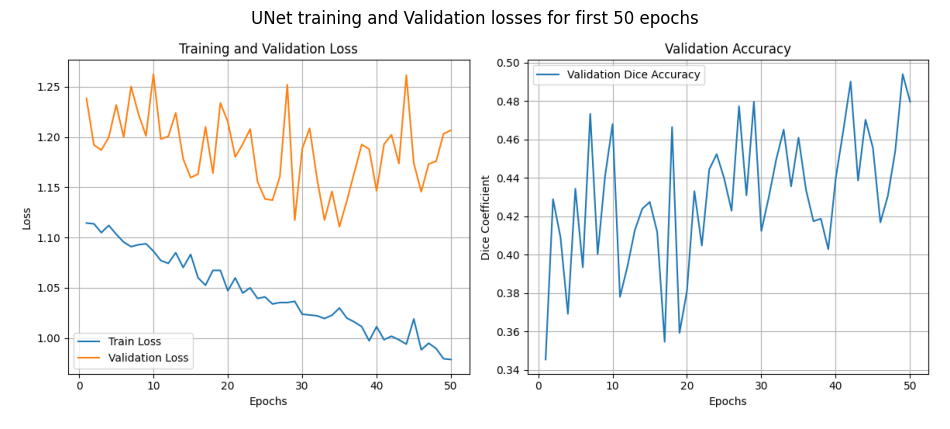

In [26]:
from PIL import Image
import matplotlib.pyplot as plt

file_path = '/home/dell/Downloads/Souraja/DA623/training_validation_curves.png'

img = Image.open(file_path)
plt.figure(figsize=(12, 12))
plt.imshow(img)
plt.axis('off') 
plt.title("UNet training and Validation losses for first 50 epochs")
plt.show()


===== Test Results =====

Dice Coefficient: 0.4810 

IoU: 0.3677

Precision: 0.3677

Recall: 1.0000

F1 Score: 0.4810

The test results are really poor. As can be seen, the training loss is gradually non-monotonically falling, but the validation loss is almost constant or very slightly decreasing. One problem can be overfitting since the dataset has smaller size and also the hidden or internal representation is much intricate, learning which requires more parameter and more data - in one word, more computer power. 

To increase the number of parameters and also to utilise the hidden representation learned from a huge dataset, I inferred the snow cover using a pre-trained Segment Anything model (SAM) with ViT image encoder. However, the result only slightly improved:

Average dice: 0.4903

Average iou: 0.3757

Average precision: 0.3980

Average recall: 0.9327

My understanding is that the dataset size is small and also the relationship between RGB and SAR images are weak as I will deeply analyse next. 

### **Image Feature Visualization using CLIP, DinoV2, and DeepLeabV3**

1. ### **CLIP**
CLIP framework learns a joint embedding space where paired data (like an image and its caption) are embedded such that their cosine similarity is maximized, while mismatched pairs are pushed apart.

Let $x_i^{(r)} \in \mathbb{R}^d$ be the RGB image embeddings, $x_i^{(s)} \in \mathbb{R}^d$ be the SAR image embeddings, $f_r(\cdot), f_s(\cdot)$ be the RGB and SAR encoders, $\mathcal{S}(x, y) = \frac{x^\top y}{\|x\|\|y\|}$ be the cosine similarity.

Then the **contrastive loss** for a batch of size $N$ is:

$$
\mathcal{L} = -\frac{1}{N} \sum_{i=1}^N \log \frac{\exp(\mathcal{S}(x_i^{(r)}, x_i^{(s)})/\tau)}{\sum_{j=1}^N \exp(\mathcal{S}(x_i^{(r)}, x_j^{(s)})/\tau)}
$$

where $\tau$ is a temperature parameter that controls the sharpness of the distribution.

In [91]:
import torch
import torch.nn as nn
import torchvision.models as models

class SimpleEncoder(nn.Module):
    def __init__(self, input_channels, embedding_dim):
        super().__init__()
        self.backbone = models.resnet18(pretrained=True)
        self.backbone.conv1 = nn.Conv2d(input_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.backbone.fc = nn.Linear(self.backbone.fc.in_features, embedding_dim)

    def forward(self, x):
        return self.backbone(x)

class ClipStyleModel(nn.Module):
    def __init__(self, embedding_dim=128):
        super().__init__()
        self.rgb_encoder = SimpleEncoder(input_channels=3, embedding_dim=embedding_dim)
        self.sar_encoder = SimpleEncoder(input_channels=1, embedding_dim=embedding_dim)

    def forward(self, rgb, sar):
        rgb_feat = self.rgb_encoder(rgb)
        sar_feat = self.sar_encoder(sar)
        return rgb_feat, sar_feat

In [92]:
from torchvision import transforms
from PIL import Image
import os
import numpy as np

transform_rgb = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

transform_sar = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

def load_image_pairs(rgb_dir, sar_dir):
    rgb_imgs, sar_imgs = [], []
    files = sorted(os.listdir(rgb_dir))  # Assumes same file names
    for f in files:
        rgb = Image.open(os.path.join(rgb_dir, f)).convert("RGB")
        sar = Image.open(os.path.join(sar_dir, f)).convert("L")
        rgb_imgs.append(transform_rgb(rgb))
        sar_imgs.append(transform_sar(sar))
    return torch.stack(rgb_imgs), torch.stack(sar_imgs)


/home/dell/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dell/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/dell/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/dell/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warning

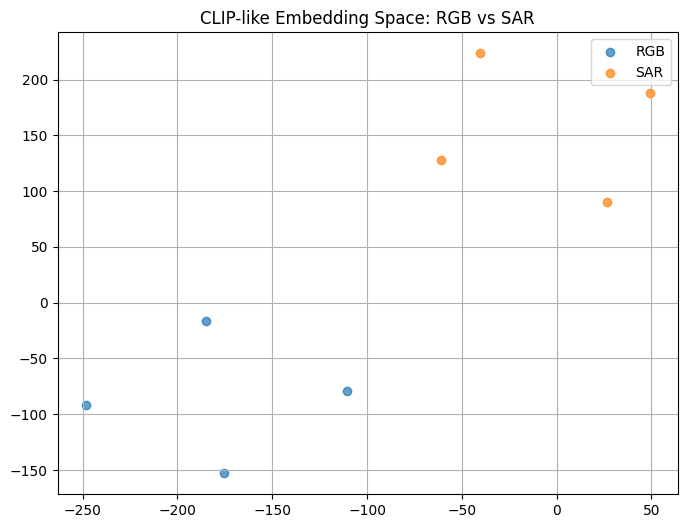

In [93]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import torch

# Load image tensors
rgb_imgs, sar_imgs = load_image_pairs("/home/dell/Downloads/Souraja/Optical_Datasets_West/Optical_Dataset_74.548_37.331/2022_Dec/RGB_numbered", "/home/dell/Downloads/Souraja/Optical_Datasets_West/Optical_Dataset_74.548_37.331/2022_Dec/SAR_numbered")

# Init model
model = ClipStyleModel(embedding_dim=64)
model.eval()

# Get embeddings
with torch.no_grad():
    rgb_feat, sar_feat = model(rgb_imgs, sar_imgs)

# Concatenate features for visualization
all_feats = torch.cat([rgb_feat, sar_feat], dim=0).numpy()
labels = ['RGB'] * len(rgb_feat) + ['SAR'] * len(sar_feat)

# t-SNE visualization
tsne = TSNE(n_components=2, perplexity=5, random_state=42)
feat_2d = tsne.fit_transform(all_feats)

# Plot
plt.figure(figsize=(8, 6))
for label in ['RGB', 'SAR']:
    idx = [i for i, l in enumerate(labels) if l == label]
    plt.scatter(feat_2d[idx, 0], feat_2d[idx, 1], label=label, alpha=0.7)
plt.legend()
plt.title("CLIP-like Embedding Space: RGB vs SAR")
plt.grid(True)
plt.show()


#### Interesting Observation

The CLIP embeddings of SAR and RGB in the reduced dimensional feature space are just a translated (shifted version) of each other. So, I could identify the nature of the domain mismatch clearly. RGB images capture visible light with fine-grained textures and colours, while SAR captures backscattered microwave signals, sensitive to surface roughness, structure, and dielectric properties. My subsequent research can be to compensate for this domain mismatch by projecting into this shared embedding space. And after that, we can use the snow mask derived from the aligned/registered RGB image as the ground truth to segment the SAR image. 

Next, I tried to visualise what the feature maps after different blocks of CLIP look like from a pre-trained model. The interesting fact is that the activation varies depending on the height of the mountains and valleys. As snow cover also varies with height, the feature encoder is slowly trying to segment the snow features.

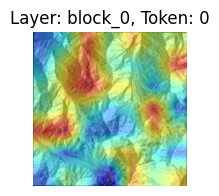

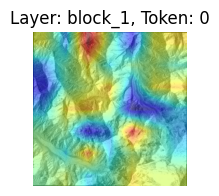

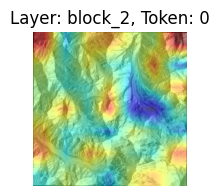

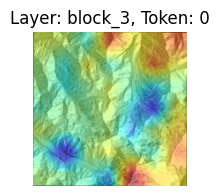

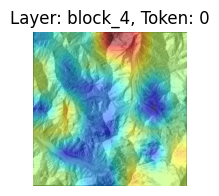

...

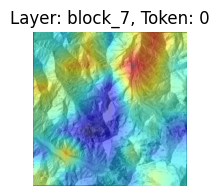

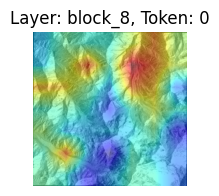

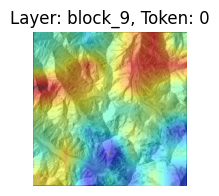

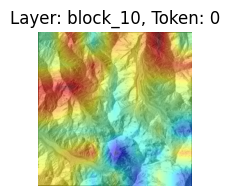

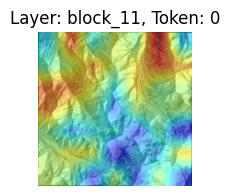

In [95]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
import open_clip

# Load model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='openai')
model.eval().to(device)

# Load image
img_path = "/home/dell/Downloads/Souraja/one_SAR_image/20141013_SAR_Image_2014_2014-10-13_17.png"  # (512, 512, 3)
img = Image.open(img_path).convert("RGB")
img_tensor = preprocess(img).unsqueeze(0).to(device)

# Hook to collect features from specific layers
activations = {}

def get_hook(name):
    def hook(module, input, output):
        activations[name] = output.detach().cpu()
    return hook

# Register hooks on selected transformer blocks
for idx, blk in enumerate(model.visual.transformer.resblocks):
    blk.register_forward_hook(get_hook(f"block_{idx}"))

# Run forward pass
with torch.no_grad():
    _ = model.encode_image(img_tensor)

# Visualize the attention maps (post-token reshaped as feature map)
def visualize_activation(activation_tensor, layer_name, token_idx=0):
    # Remove batch dimension: shape becomes [seq_len, dim]
    act = activation_tensor.squeeze(0)

    # If CLS token present, remove it
    if act.shape[0] == 50:
        act = act[1:]  # remove CLS -> shape: [49, dim]

    # Dynamically compute spatial shape
    num_tokens = act.shape[0]
    h = w = int(np.sqrt(num_tokens))

    if h * w != num_tokens:
        print(f"Unexpected number of tokens: {num_tokens}, cannot form square grid.")
        return

    # Activation of a single neuron across all patches
    fmap = act[:, token_idx].reshape(h, w).detach().cpu().numpy()

    # Normalize to [0, 1]
    fmap = (fmap - np.min(fmap)) / (np.max(fmap) - np.min(fmap) + 1e-6)

    # Resize to match input image
    fmap_resized = cv2.resize(fmap, (img.size[0], img.size[1]))

    # Overlay heatmap on original image
    plt.figure(figsize=(2, 2))
    plt.imshow(img)
    plt.imshow(fmap_resized, cmap='jet', alpha=0.5)
    plt.title(f'Layer: {layer_name}, Token: {token_idx}')
    plt.axis('off')
    plt.show()


# Show heatmaps from a few layers
for layer in ["block_0", "block_1", "block_2", "block_3", "block_4", "block_5", "block_6", "block_7", "block_8", "block_9", "block_10", "block_11"]:
    if layer in activations:
        visualize_activation(activations[layer], layer, token_idx=0)


### Fourier Domain Spectral Content and Activation Map Comparison Between Paired SAR and RGB Images

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((768,), eps=1e-05, elementwise_affine

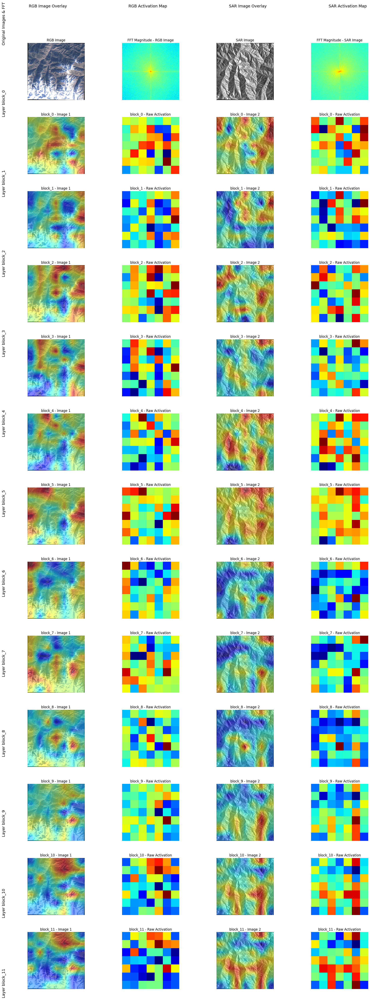

In [98]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
import open_clip
from scipy import fftpack
import matplotlib.gridspec as gridspec


def compute_fft(img_array):
    
    if len(img_array.shape) == 3:
        gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    else:
        gray = img_array
    
   
    f = fftpack.fft2(gray)
   
    fshift = fftpack.fftshift(f)
  
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)
  
    magnitude_spectrum = (magnitude_spectrum - np.min(magnitude_spectrum)) / (np.max(magnitude_spectrum) - np.min(magnitude_spectrum) + 1e-6)
    
    return magnitude_spectrum


device = "cuda" if torch.cuda.is_available() else "cpu"
model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='openai')
print(model)
model.eval().to(device)


def process_image(img_path, model, preprocess, device):
  
    img = Image.open(img_path).convert("RGB")
    img_tensor = preprocess(img).unsqueeze(0).to(device)
    
  
    img_array = np.array(img)

    activations = {}
    hooks = []

    for idx, blk in enumerate(model.visual.transformer.resblocks):
        hook = blk.register_forward_hook(lambda module, input, output, name=f"block_{idx}": 
                                          activations.update({name: output.detach().cpu()}))
        hooks.append(hook)
    

    with torch.no_grad():
        _ = model.encode_image(img_tensor)
    

    for hook in hooks:
        hook.remove()
    
    return img, img_array, activations

def get_activation_map(activation_tensor, token_idx=0):

    act = activation_tensor.squeeze(0)
    # If CLS token present, remove it
    if act.shape[0] == 50:
        act = act[1:]  # remove CLS -> shape: [49, dim]
    
 
    num_tokens = act.shape[0]
    h = w = int(np.sqrt(num_tokens))
    if h * w != num_tokens:
        print(f"Unexpected number of tokens: {num_tokens}, cannot form square grid.")
        return None
    
    # Activation of a single neuron across all patches
    fmap = act[:, token_idx].reshape(h, w).numpy()

    fmap = (fmap - np.min(fmap)) / (np.max(fmap) - np.min(fmap) + 1e-6)
    
    return fmap


def visualize_two_images(img_path1, img_path2, model, preprocess, device, layers_to_show=None):
 
    img1, img_array1, activations1 = process_image(img_path1, model, preprocess, device)
    img2, img_array2, activations2 = process_image(img_path2, model, preprocess, device)
    

    fft1 = compute_fft(img_array1)
    fft2 = compute_fft(img_array2)
    
 
    if layers_to_show is None:
        layers_to_show = ["block_0", "block_3", "block_7", "block_11"]
    

    fig = plt.figure(figsize=(20, 4 * (len(layers_to_show) + 1)))
    gs = gridspec.GridSpec(len(layers_to_show) + 1, 4)
    
    ax1 = plt.subplot(gs[0, 0])
    ax1.imshow(img1)
    ax1.set_title("RGB Image")
    ax1.axis('off')
    
  
    ax2 = plt.subplot(gs[0, 1])
    ax2.imshow(fft1, cmap='jet')
    ax2.set_title("FFT Magnitude - RGB Image")
    ax2.axis('off')
    

    ax3 = plt.subplot(gs[0, 2])
    ax3.imshow(img2)
    ax3.set_title("SAR Image")
    ax3.axis('off')
    

    ax4 = plt.subplot(gs[0, 3])
    ax4.imshow(fft2, cmap='jet')
    ax4.set_title("FFT Magnitude - SAR Image")
    ax4.axis('off')
    

    fig.text(0.01, 1 - 0.5/(len(layers_to_show) + 1), "Original Images & FFT", 
             va='center', ha='left', fontsize=14, rotation=90)
    

    for i, layer in enumerate(layers_to_show):
        row_idx = i + 1  # Start from second row

        if layer not in activations1 or layer not in activations2:
            continue
        

        fmap1 = get_activation_map(activations1[layer])
        fmap2 = get_activation_map(activations2[layer])
        
        if fmap1 is None or fmap2 is None:
            continue
        
  
        fmap1_resized = cv2.resize(fmap1, (img1.size[0], img1.size[1]))
        fmap2_resized = cv2.resize(fmap2, (img2.size[0], img2.size[1]))
        
     
        ax1 = plt.subplot(gs[row_idx, 0])
        ax1.imshow(img1)
        im1 = ax1.imshow(fmap1_resized, cmap='jet', alpha=0.5)
        ax1.set_title(f"{layer} - Image 1")
        ax1.axis('off')
 
        ax2 = plt.subplot(gs[row_idx, 1])
        ax2.imshow(fmap1, cmap='jet')
        ax2.set_title(f"{layer} - Raw Activation")
        ax2.axis('off')
        

        ax3 = plt.subplot(gs[row_idx, 2])
        ax3.imshow(img2)
        im2 = ax3.imshow(fmap2_resized, cmap='jet', alpha=0.5)
        ax3.set_title(f"{layer} - Image 2")
        ax3.axis('off')
        

        ax4 = plt.subplot(gs[row_idx, 3])
        ax4.imshow(fmap2, cmap='jet')
        ax4.set_title(f"{layer} - Raw Activation")
        ax4.axis('off')
        
  
        fig.text(0.01, 1 - (row_idx + 0.5)/(len(layers_to_show) + 1), f"Layer {layer}", 
                 va='center', ha='left', fontsize=14, rotation=90)
    
    # Add column labels
    col_positions = [0.125, 0.375, 0.625, 0.875]
    col_labels = ["RGB Image Overlay", "RGB Activation Map", "SAR Image Overlay", "SAR Activation Map"]
    for i, (pos, label) in enumerate(zip(col_positions, col_labels)):
        fig.text(pos, 0.98, label, va='top', ha='center', fontsize=14)
    
    plt.tight_layout(rect=[0.03, 0.03, 0.97, 0.95])  
    plt.subplots_adjust(wspace=0.1, hspace=0.3)
    
    return fig

# Example usage
if __name__ == "__main__":
    # Replace with your actual file paths
    #img_path1 = "/home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2022_Aug/RGB/RGB_Image_2022_2022-08-06_34.png"
    #img_path2 = "/home/dell/Downloads/Souraja/Optical_Dataset_73.848_35.321/2022_Aug/SAR/SAR_Image_2022_2022-08-07_34.png"
    img_path1 = "/home/dell/Downloads/Souraja/Optical_Datasets_West/Optical_Dataset_73.848_35.321/2022_Dec/RGB/RGB_Image_2022_2022-12-28_21.png"
    img_path2 = "/home/dell/Downloads/Souraja/Optical_Datasets_West/Optical_Dataset_73.848_35.321/2022_Dec/SAR/SAR_Image_2022_2022-12-29_21.png"
    # Display activations for all blocks
    all_blocks = [f"block_{i}" for i in range(12)]
    
    # Create visualization for specified layers
    fig = visualize_two_images(
        img_path1, 
        img_path2, 
        model, 
        preprocess, 
        device,
        layers_to_show=all_blocks
    )
    
    plt.savefig('clip_activations_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

In [97]:
from torchvision import models
model = models.segmentation.deeplabv3_resnet50(pretrained=True)
print(model)

/home/dell/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dell/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

### DeepLab V3 Activation map comparison

DeepLabV3 typically uses a backbone CNN like ResNet. The key idea is to replace strided convolutions or pooling layers with dilated convolutions to preserve the spatial resolution.

1. Dilated Convolution (Atrous Convolution)

A dilated convolution introduces holes (zeros) between kernel elements, allowing larger receptive fields without increasing the number of parameters.

Mathematically, a 1d dilated convolution is defined as:

$$
y[i] = \sum_{k=1}^{K} x[i + r \cdot k] \cdot w[k]
$$

* $x$ is the input signal
* $w$ is the convolution kernel
* $r$ is the dilation rate
* $K$ is the kernel size

In 2D, the dilation enlarges the kernel by inserting zeros between elements. For example, a 3×3 kernel with $r=2$ becomes a 5×5 receptive field without extra parameters.

2. Atrous Spatial Pyramid Pooling (ASPP)

ASPP aggregates features at multiple scales by applying parallel atrous convolutions with different dilation rates. This helps the network capture objects of varying sizes.

Given a feature map $F \in \mathbb{R}^{h \times w \times d}$, ASPP outputs:

$$
\text{ASPP}(F) = \text{Concat}\left( \text{Conv}_{1\times1}(F), \text{AtrousConv}_r(F) \text{ for } r \in \{6, 12, 18\}, \text{ImagePooling}(F) \right)
$$

* $\text{Conv}_{1\times1}$ is a standard convolution
* $\text{AtrousConv}_r$ applies a $3 \times 3$ atrous convolution with dilation rate $r$
* $\text{ImagePooling}(F)$ applies global average pooling, followed by upsampling

Each branch produces a feature map of the same size, and they are **concatenated** along the channel axis.

3. Output Layer

After ASPP, a 1×1 convolution is applied to reduce the channel dimension, followed by bilinear upsampling to restore the original resolution:

$$
\hat{S} = \text{Upsample}(\text{Conv}_{1\times1}(\text{ASPP}(F)))
$$

This yields the per-pixel class logits $\hat{S} \in \mathbb{R}^{H \times W \times C}$.

4. Loss Function

DeepLabV3 is trained using pixel-wise cross-entropy loss:

$$
\mathcal{L} = -\sum_{i=1}^H \sum_{j=1}^W \sum_{c=1}^C y_{ij}^c \log(\hat{y}_{ij}^c)
$$

Where:

* $y_{ij}^c \in \{0, 1\}$ is the one-hot ground truth label for pixel $(i, j)$
* $\hat{y}_{ij}^c$ is the softmax probability for class $c$ at that pixel


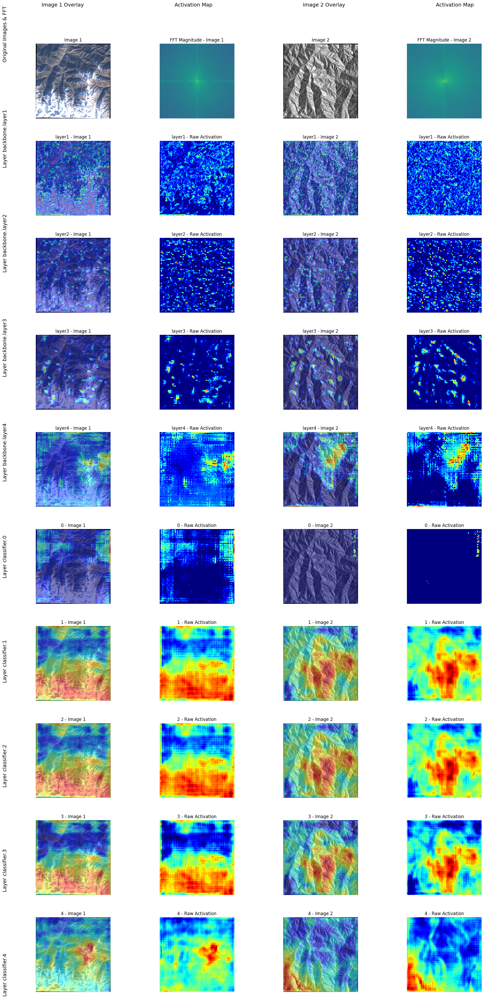

In [100]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
from scipy import fftpack
import matplotlib.gridspec as gridspec
import torchvision.models as models

# Choose model type: 'deeplabv3' or 'dinov2'
MODEL_TYPE = 'deeplabv3'  # Change to 'dinov2' to use DINOv2 instead

# Function to compute and visualize 2D FFT
def compute_fft(img_array):
    # Convert to grayscale if it's RGB
    if len(img_array.shape) == 3:
        gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    else:
        gray = img_array
    
    # Compute 2D FFT
    f = fftpack.fft2(gray)
    # Shift zero frequency to center
    fshift = fftpack.fftshift(f)
    # Calculate magnitude spectrum
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)
    # Normalize to [0, 1]
    magnitude_spectrum = (magnitude_spectrum - np.min(magnitude_spectrum)) / (np.max(magnitude_spectrum) - np.min(magnitude_spectrum) + 1e-6)
    
    return magnitude_spectrum

# Choose and load the model
device = "cuda" if torch.cuda.is_available() else "cpu"

if MODEL_TYPE == 'deeplabv3':
    # Load DeepLabV3 with ResNet-50 backbone
    model = models.segmentation.deeplabv3_resnet50(pretrained=True)
    model.eval().to(device)
    
    # Define preprocessing for DeepLabV3
    preprocess = T.Compose([
        T.Resize(520),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Define the layers to extract features from
    target_layers = [
        "backbone.layer1",
        "backbone.layer2", 
        "backbone.layer3",
        "backbone.layer4",
        "classifier.0",  # ASPP branch
        "classifier.1",
        "classifier.2",
        "classifier.3",
        "classifier.4"   # Final conv layer
    ]
    
elif MODEL_TYPE == 'dinov2':
    # Load DINOv2 model (ViT-B/14)
    import torch.hub
    model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
    model.eval().to(device)
    
    # Define preprocessing for DINOv2
    preprocess = T.Compose([
        T.Resize(518),
        T.CenterCrop(518),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Define the layers to extract features from (blocks in DINOv2)
    target_layers = [f"blocks.{i}" for i in range(0, 12, 2)]  # Get every other block

# Function to get the module from a hierarchical string name
def get_module(model, name):
    module = model
    for n in name.split('.'):
        if hasattr(module, n):
            module = getattr(module, n)
        elif n.isdigit() and isinstance(module, torch.nn.Sequential):
            module = module[int(n)]
        else:
            raise AttributeError(f"Module '{type(module).__name__}' has no attribute '{n}'")
    return module


# Function to process an image and get activations
def process_image(img_path, model, preprocess, device, target_layers):
    # Load and preprocess image
    img = Image.open(img_path).convert("RGB")
    img_tensor = preprocess(img).unsqueeze(0).to(device)
    
    # Convert PIL Image to numpy array for FFT computation
    img_array = np.array(img)
    
    # Hook to collect features from specific layers
    activations = {}
    hooks = []
    
    # Register hooks on selected layers
    for layer_name in target_layers:
        module = get_module(model, layer_name)
        hook = module.register_forward_hook(
            lambda module, input, output, name=layer_name: activations.update({name: output.detach().cpu()})
        )
        hooks.append(hook)
    
    # Run forward pass
    with torch.no_grad():
        if MODEL_TYPE == 'deeplabv3':
            _ = model(img_tensor)['out']
        elif MODEL_TYPE == 'dinov2':
            _ = model(img_tensor)
    
    # Remove hooks
    for hook in hooks:
        hook.remove()
    
    return img, img_array, activations

# Function to get activation map from a feature tensor
def get_activation_map(activation_tensor, feature_idx=0):
    # For DeepLabV3: activation shape is [B, C, H, W]
    # For DINOv2: activation shape depends on the layer (attention or features)
    
    if MODEL_TYPE == 'deeplabv3':
        # Take the specified feature channel
        fmap = activation_tensor[0, feature_idx].numpy()
    
    elif MODEL_TYPE == 'dinov2':
        # Handle different types of tensors
        if len(activation_tensor.shape) == 3:  # [B, N, C] for attention
            # Remove batch dimension and get per-token feature
            act = activation_tensor.squeeze(0)
            
            # Skip CLS token
            if act.shape[0] > 1:
                act = act[1:]
            
            # Reshape to spatial dimensions
            side_len = int(np.sqrt(act.shape[0]))
            if side_len * side_len == act.shape[0]:  # Perfect square check
                fmap = act[:, feature_idx].reshape(side_len, side_len).numpy()
            else:
                # Can't reshape to square, use as is
                fmap = act[:, feature_idx].numpy().reshape(-1, 1)
                return None
        else:  # [B, C, H, W] for features
            fmap = activation_tensor[0, feature_idx].numpy()
    
    # Normalize to [0, 1]
    fmap = (fmap - np.min(fmap)) / (np.max(fmap) - np.min(fmap) + 1e-6)
    
    return fmap

# Function to create the full visualization
def visualize_two_images(img_path1, img_path2, model, preprocess, device, target_layers):
    # Process both images
    img1, img_array1, activations1 = process_image(img_path1, model, preprocess, device, target_layers)
    img2, img_array2, activations2 = process_image(img_path2, model, preprocess, device, target_layers)
    
    # Compute FFT for both images
    fft1 = compute_fft(img_array1)
    fft2 = compute_fft(img_array2)
    
    # Set up the figure with GridSpec
    fig = plt.figure(figsize=(20, 4 * (len(target_layers) + 1)))
    gs = gridspec.GridSpec(len(target_layers) + 1, 4)
    
    # First row: Original images and their FFT
    # Image 1
    ax1 = plt.subplot(gs[0, 0])
    ax1.imshow(img1)
    ax1.set_title("Image 1")
    ax1.axis('off')
    
    # FFT 1
    ax2 = plt.subplot(gs[0, 1])
    ax2.imshow(fft1, cmap='viridis')
    ax2.set_title("FFT Magnitude - Image 1")
    ax2.axis('off')
    
    # Image 2
    ax3 = plt.subplot(gs[0, 2])
    ax3.imshow(img2)
    ax3.set_title("Image 2")
    ax3.axis('off')
    
    # FFT 2
    ax4 = plt.subplot(gs[0, 3])
    ax4.imshow(fft2, cmap='viridis')
    ax4.set_title("FFT Magnitude - Image 2")
    ax4.axis('off')
    
    # Add row label for the first row
    fig.text(0.01, 1 - 0.5/(len(target_layers) + 1), "Original Images & FFT", 
             va='center', ha='left', fontsize=14, rotation=90)
    
    # Determine which feature to visualize for each layer
    feature_indices = {}
    for layer in target_layers:
        if MODEL_TYPE == 'deeplabv3':
            # Use the middle channel for each layer
            if layer in activations1:
                mid_channel = activations1[layer].shape[1] // 2
                feature_indices[layer] = mid_channel
        elif MODEL_TYPE == 'dinov2':
            # Use first feature dimension
            feature_indices[layer] = 0
    
    # Activation maps for each specified layer
    for i, layer in enumerate(target_layers):
        row_idx = i + 1  # Start from second row
        
        # Skip if layer not in activations
        if layer not in activations1 or layer not in activations2:
            continue
        
        feature_idx = feature_indices[layer]
        
        # Get activation maps
        fmap1 = get_activation_map(activations1[layer], feature_idx)
        fmap2 = get_activation_map(activations2[layer], feature_idx)
        
        if fmap1 is None or fmap2 is None:
            continue
        
        # Resize activation maps to match input image dimensions
        fmap1_resized = cv2.resize(fmap1, (img1.size[0], img1.size[1]))
        fmap2_resized = cv2.resize(fmap2, (img2.size[0], img2.size[1]))
        
        # Plot overlay for image 1
        ax1 = plt.subplot(gs[row_idx, 0])
        ax1.imshow(img1)
        im1 = ax1.imshow(fmap1_resized, cmap='jet', alpha=0.5)
        ax1.set_title(f"{layer.split('.')[-1]} - Image 1")
        ax1.axis('off')
        
        # Plot raw activation map for image 1
        ax2 = plt.subplot(gs[row_idx, 1])
        ax2.imshow(fmap1, cmap='jet')
        ax2.set_title(f"{layer.split('.')[-1]} - Raw Activation")
        ax2.axis('off')
        
        # Plot overlay for image 2
        ax3 = plt.subplot(gs[row_idx, 2])
        ax3.imshow(img2)
        im2 = ax3.imshow(fmap2_resized, cmap='jet', alpha=0.5)
        ax3.set_title(f"{layer.split('.')[-1]} - Image 2")
        ax3.axis('off')
        
        # Plot raw activation map for image 2
        ax4 = plt.subplot(gs[row_idx, 3])
        ax4.imshow(fmap2, cmap='jet')
        ax4.set_title(f"{layer.split('.')[-1]} - Raw Activation")
        ax4.axis('off')
        
        # Add row label
        layer_name = layer.split('.')[-2] + '.' + layer.split('.')[-1] if '.' in layer else layer
        fig.text(0.01, 1 - (row_idx + 0.5)/(len(target_layers) + 1), f"Layer {layer_name}", 
                 va='center', ha='left', fontsize=14, rotation=90)
    
    # Add column labels
    col_positions = [0.125, 0.375, 0.625, 0.875]
    col_labels = ["Image 1 Overlay", "Activation Map", "Image 2 Overlay", "Activation Map"]
    for i, (pos, label) in enumerate(zip(col_positions, col_labels)):
        fig.text(pos, 0.98, label, va='top', ha='center', fontsize=14)
    
    plt.tight_layout(rect=[0.03, 0.03, 0.97, 0.95])  # Adjust layout to make room for labels
    plt.subplots_adjust(wspace=0.1, hspace=0.3)
    
    return fig

# Alternative implementation for SAM (Segment Anything Model)
def visualize_sam_features(img_path1, img_path2):
    try:
        # Import SAM libraries
        import sys
        sys.path.append("segment-anything")  # Adjust this to your SAM installation path
        from segment_anything import sam_model_registry, SamPredictor
        
        # Initialize SAM
        sam_checkpoint = "sam_vit_h_4b8939.pth"  # Adjust path as needed
        model_type = "vit_h"
        sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
        sam.to(device)
        predictor = SamPredictor(sam)
        
        # Process images
        img1 = cv2.imread(img_path1)
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
        predictor.set_image(img1)
        img1_tensor = predictor.features
        
        img2 = cv2.imread(img_path2)
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
        predictor.set_image(img2)
        img2_tensor = predictor.features
        
        # Set up visualization similar to previous function
        # ...
        
    except ImportError:
        print("SAM dependencies not installed. Please install segment-anything.")
        return None

# Example usage
if __name__ == "__main__":
    # Replace with your actual file paths
    img_path1 = "/home/dell/Downloads/Souraja/Optical_Datasets_West/Optical_Dataset_73.848_35.321/2022_Dec/RGB/RGB_Image_2022_2022-12-28_21.png"
    img_path2 = "/home/dell/Downloads/Souraja/Optical_Datasets_West/Optical_Dataset_73.848_35.321/2022_Dec/SAR/SAR_Image_2022_2022-12-29_21.png"
    
    # Create visualization for specified model
    fig = visualize_two_images(
        img_path1,
        img_path2,
        model,
        preprocess,
        device,
        target_layers
    )
    
    model_name = 'deeplabv3' if MODEL_TYPE == 'deeplabv3' else 'dinov2'
    plt.savefig(f'{model_name}_activations_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()


### DinoV2

Using cache found in /home/dell/.cache/torch/hub/facebookresearch_dinov2_main
/home/dell/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/home/dell/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/home/dell/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


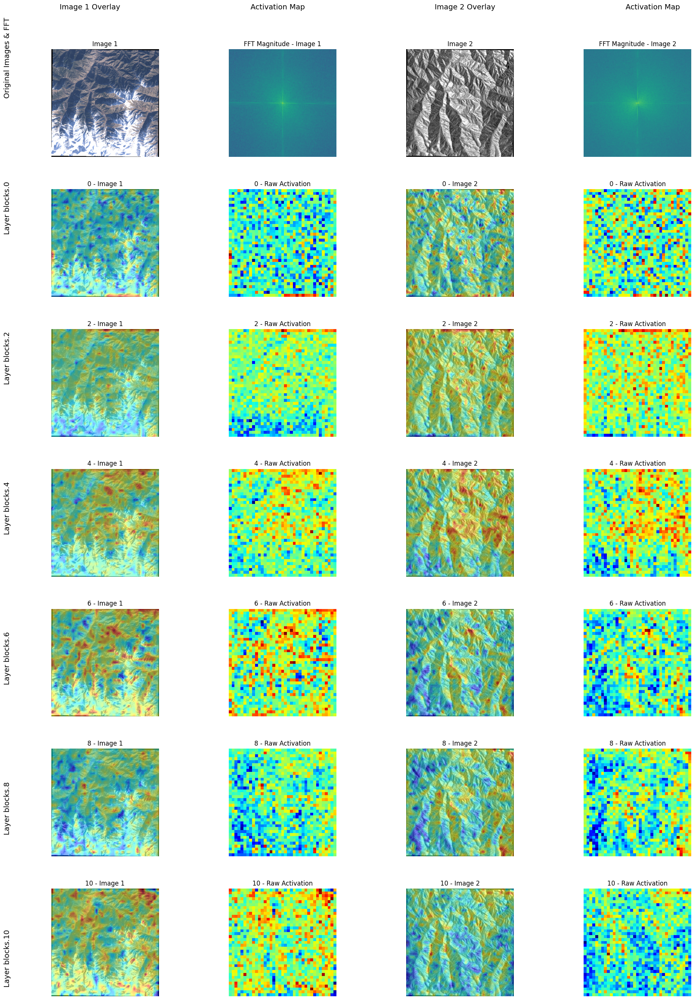

In [101]:
MODEL_TYPE = 'dinov2'

# Load DINOv2 model
import torch.hub
model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
model.eval().to(device)

# Define preprocessing for DINOv2
preprocess = T.Compose([
    T.Resize(518),
    T.CenterCrop(518),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define the layers to extract features from (blocks in DINOv2)
target_layers = [f"blocks.{i}" for i in range(0, 12, 2)]  # Get every other block

# Create visualization for DINOv2
fig = visualize_two_images(
    img_path1,
    img_path2,
    model,
    preprocess,
    device,
    target_layers
)

plt.savefig('dinov2_activations_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


## Climate Modelling

Coord: 74.548, 37.321
Coord: 76.148, 35.321
Coord: 75.548, 35.321
Coord: 74.548, 35.321
Coord: 74.748, 36.321
Coord: 76.548, 35.421
Coord: 73.548, 36.321
Coord: 74.948, 35.121
Coord: 74.548, 35.721
   temperature_2m_max  temperature_2m_min  precipitation_sum  snowfall_sum  \
0                -4.9                -7.6                3.8          2.80   
1                 1.5                 0.2                0.1          0.00   
2                 4.8                 3.5                0.2          0.00   
3                 2.8                 1.8                0.0          0.00   
4                 4.8                 4.2                0.5          0.00   
5                -3.8                -9.4                0.6          0.98   
6                 4.7                 3.8                0.0          0.00   
7                 5.4                 4.8                0.0          0.00   
8                -0.9                -1.5                0.5          0.98   
9                -7.3 

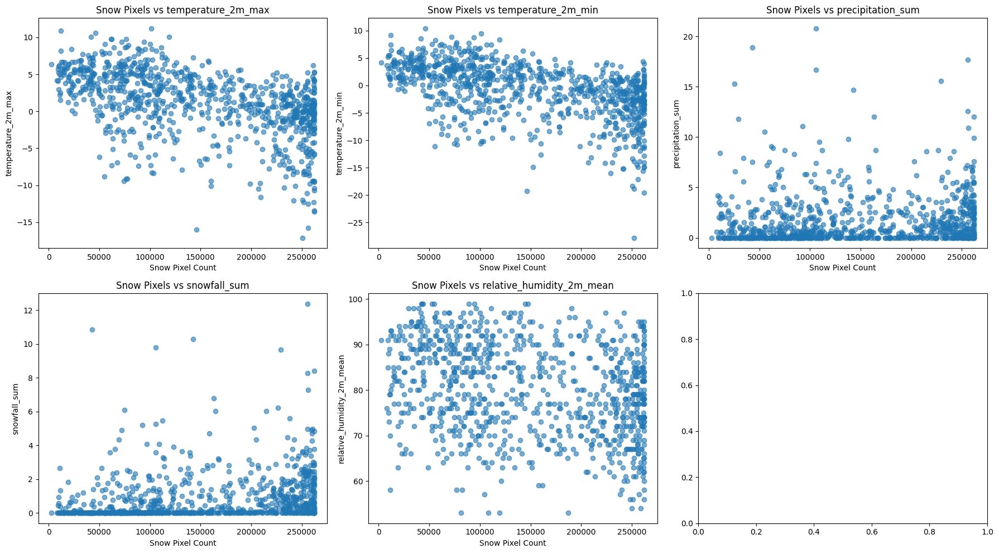

In [86]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from glob import glob


optical_base = "/home/dell/Downloads/Souraja/With_climate_Data"
optical_dirs = glob(os.path.join(optical_base, "Optical_Dataset_*"))


results = {
    "temperature_2m_max": [],
    "temperature_2m_min": [],
    "precipitation_sum": [],
    "snowfall_sum": [],
    "relative_humidity_2m_mean": [],
    "snow_pixel_count": []
}


for optical_dir in optical_dirs:

    coord = optical_dir.split("_")[-2] + "_" + optical_dir.split("_")[-1]
    coord_tuple = (optical_dir.split("_")[-2], optical_dir.split("_")[-1])
    print(f"Coord: {coord_tuple[0]}, {coord_tuple[1]}")
    
    csv_file = f"openmeteo_weather_{coord}.csv"
    if not os.path.exists(csv_file):
        print("Path doesn't exist")
        continue

    df = pd.read_csv(csv_file, parse_dates=["time"])
    if 'snow_depth_mean' in df.columns:
        df.drop('snow_depth_mean', axis=1, inplace=True)

    for root, dirs, files in os.walk(optical_dir):
        if "NDFSI" in root:
            for file in files:
                if file.endswith(".png") and "NDFSI_Mask" in file:
                    img_path = os.path.join(root, file)
                    img = cv2.imread(img_path)
                    if img is None or img.shape != (512, 512, 3):
                        continue

                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    snow_pixel_count = (gray == 0).sum()
        
                    date_str = file.split("_")[-2]
                    try:
                        date_obj = pd.to_datetime(date_str)
                    except:
                        continue

                    match = df[df["time"] == date_obj]
                    if match.empty or match.isna().any(axis=1).iloc[0]:
                        print("Nothing found")
                        continue

                    results["snow_pixel_count"].append(snow_pixel_count)
                    for col in results.keys():
                        if col != "snow_pixel_count":
                            results[col].append(match.iloc[0][col])

results_df = pd.DataFrame(results)
print(results_df.head(10))

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, col in enumerate(results_df.columns[:-1]):  # exclude 'snow_pixel_count'
    axes[idx].scatter(results_df["snow_pixel_count"], results_df[col], alpha=0.6)
    axes[idx].set_title(f"Snow Pixels vs {col}")
    axes[idx].set_xlabel("Snow Pixel Count")
    axes[idx].set_ylabel(col)

plt.tight_layout()
plt.show()


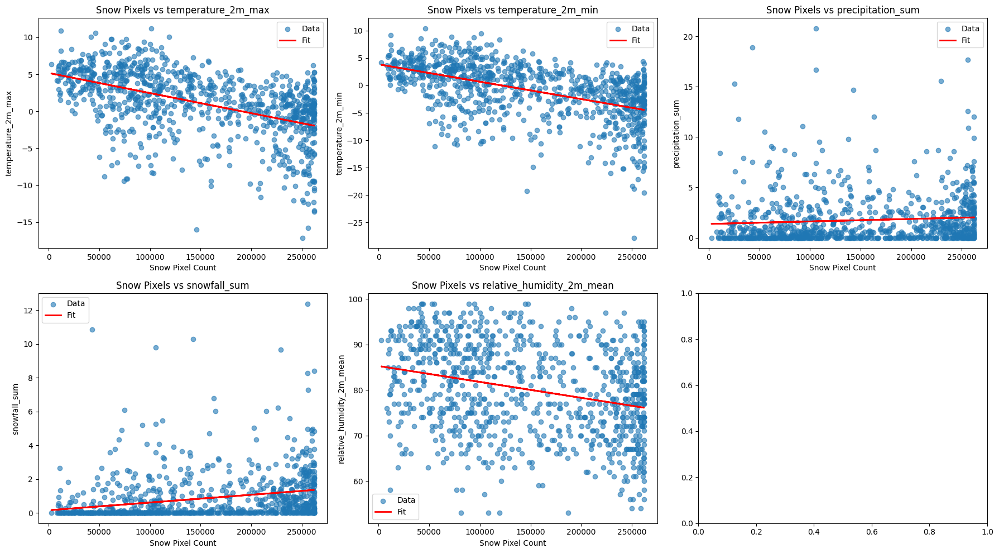

In [70]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Save DataFrame
results_df.to_csv("snow_climate_data.csv", index=False)

# Set up plots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

x = results_df["snow_pixel_count"].values.reshape(-1, 1)

# Create output folder if needed
os.makedirs("plots", exist_ok=True)

for idx, col in enumerate(results_df.columns[:-1]):  # exclude 'snow_pixel_count'
    y = results_df[col].values.reshape(-1, 1)

    # Drop NaNs for regression
    valid_idx = ~np.isnan(y).flatten()
    x_valid = x[valid_idx]
    y_valid = y[valid_idx]

    # Scatter plot
    axes[idx].scatter(x_valid, y_valid, alpha=0.6, label='Data')

    # Linear Regression
    model = LinearRegression()
    model.fit(x_valid, y_valid)
    y_pred = model.predict(x_valid)

    # Plot regression line
    axes[idx].plot(x_valid, y_pred, color='red', linewidth=2, label='Fit')
    axes[idx].set_title(f"Snow Pixels vs {col}")
    axes[idx].set_xlabel("Snow Pixel Count")
    axes[idx].set_ylabel(col)
    axes[idx].legend()

# Save the plot figure
plt.tight_layout()
plt.savefig("plots/snow_vs_climate_scatter_with_regression.png", dpi=300)
plt.show()


In [73]:
results_df.head(20)

,temperature_2m_max,temperature_2m_min,precipitation_sum,snowfall_sum,relative_humidity_2m_mean,snow_pixel_count
0,-4.9,-7.6,3.8,2.80,68,178105
1,1.5,0.2,0.1,0.00,86,129902
2,4.8,3.5,0.2,0.00,96,55291
3,2.8,1.8,0.0,0.00,90,49417
4,4.8,4.2,0.5,0.00,99,41934
5,-3.8,-9.4,0.6,0.98,73,222643
6,4.7,3.8,0.0,0.00,91,230467
7,5.4,4.8,0.0,0.00,90,174042
8,-0.9,-1.5,0.5,0.98,66,175360
9,-7.3,-8.6,0.0,0.00,70,178656


In [74]:
df.head(20)

,time,temperature_2m_max,temperature_2m_min,precipitation_sum,snowfall_sum,relative_humidity_2m_mean
0,2014-01-01,-1.4,-4.8,0.0,0.63,55
1,2014-01-02,-0.6,-1.4,0.0,0.14,59
2,2014-01-03,0.2,-0.7,2.1,2.03,67
3,2014-01-04,0.6,-0.3,1.0,1.05,74
4,2014-01-05,0.0,-1.5,0.0,0.21,70
5,2014-01-06,-1.6,-5.7,0.1,0.21,63
6,2014-01-07,-3.8,-5.7,0.1,0.84,59
7,2014-01-08,-4.9,-5.6,0.2,1.40,63
8,2014-01-09,-4.6,-5.7,0.2,1.19,62
9,2014-01-10,-3.0,-4.8,0.0,0.00,47


Coord: 74.548, 37.321
Coord: 76.148, 35.321
Coord: 75.548, 35.321
Coord: 74.548, 35.321
Coord: 74.748, 36.321
Coord: 76.548, 35.421
Coord: 73.548, 36.321
Coord: 74.948, 35.121
Coord: 74.548, 35.721
          time  temperature_2m_max  temperature_2m_min  precipitation_sum  \
5   2014-01-06                -3.8                -9.4                0.6   
59  2014-01-13                -1.0                -2.5                0.0   
402 2014-01-20                -3.0                -4.0                0.1   
853 2014-01-20                -2.7                -3.7                0.2   
691 2014-01-29                 1.5                -0.2                2.3   
58  2014-01-29                 1.0                -1.0                2.6   
228 2014-01-29                 2.0                 0.2                3.2   
11  2014-02-07                -0.2                -1.4                0.3   
566 2014-02-23                 0.1                -2.2                0.9   
10  2014-02-23                 0

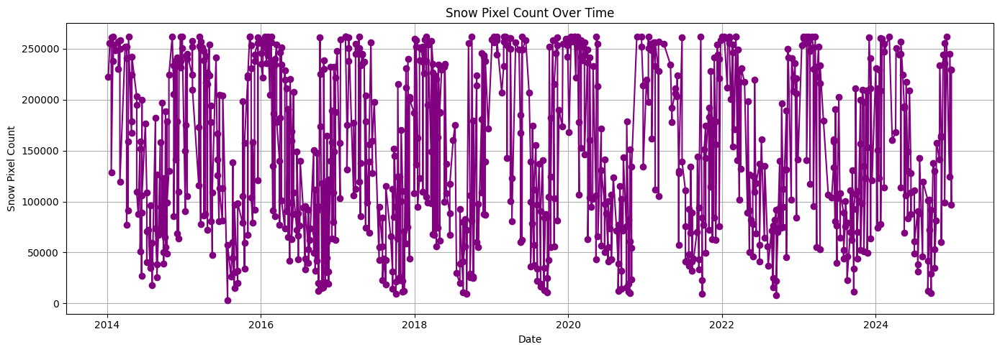

In [79]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from glob import glob
import seaborn as sns
from sklearn.linear_model import LinearRegression
from matplotlib.dates import DateFormatter

# Base directory for optical data
optical_base = "/home/dell/Downloads/Souraja/With_climate_Data"
optical_dirs = glob(os.path.join(optical_base, "Optical_Dataset_*"))

# Initialize dictionary to store results
results = {
    "time": [],
    "temperature_2m_max": [],
    "temperature_2m_min": [],
    "precipitation_sum": [],
    "snowfall_sum": [],
    "relative_humidity_2m_mean": [],
    "snow_pixel_count": []
}

# Collect data from all optical directories
for optical_dir in optical_dirs:
    coord = optical_dir.split("_")[-2] + "_" + optical_dir.split("_")[-1]
    coord_tuple = (optical_dir.split("_")[-2], optical_dir.split("_")[-1])
    print(f"Coord: {coord_tuple[0]}, {coord_tuple[1]}")
    
    csv_file = f"openmeteo_weather_{coord}.csv"
    if not os.path.exists(csv_file):
        print("Path doesn't exist")
        continue
        
    df = pd.read_csv(csv_file, parse_dates=["time"])
    if 'snow_depth_mean' in df.columns:
        df.drop('snow_depth_mean', axis=1, inplace=True)
        
    for root, dirs, files in os.walk(optical_dir):
        if "NDFSI" in root:
            for file in files:
                if file.endswith(".png") and "NDFSI_Mask" in file:
                    img_path = os.path.join(root, file)
                    img = cv2.imread(img_path)
                    if img is None or img.shape != (512, 512, 3):
                        continue
                        
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    snow_pixel_count = (gray == 0).sum()
        
                    date_str = file.split("_")[-2]
                    try:
                        date_obj = pd.to_datetime(date_str)
                    except:
                        continue
                        
                    match = df[df["time"] == date_obj]
                    if match.empty or match.isna().any(axis=1).iloc[0]:
                        print("Nothing found")
                        continue
                        
                    results["time"].append(date_obj)
                    results["snow_pixel_count"].append(snow_pixel_count)
                    for col in list(results.keys())[1:-1]:  # skip 'time' and 'snow_pixel_count'
                        results[col].append(match.iloc[0][col])

# Create dataframe and sort by time
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="time")  # Proper way to sort by datetime
print(results_df.head(10))

# Create plots directory
os.makedirs("plots", exist_ok=True)

# Save the sorted dataframe
results_df.to_csv("plots/results_df.csv", index=False)

# Plot scatter plots: snow pixel count vs each climate variable
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, col in enumerate(results_df.columns[1:-1]):  # skip 'time' and 'snow_pixel_count'
    axes[idx].scatter(results_df["snow_pixel_count"], results_df[col], alpha=0.6)
    axes[idx].set_title(f"Snow Pixels vs {col}")
    axes[idx].set_xlabel("Snow Pixel Count")
    axes[idx].set_ylabel(col)

plt.tight_layout()
plt.savefig("plots/climate_vs_snow_pixels.png", dpi=300)
plt.close()

x = pd.to_datetime(results_df["time"]).to_numpy()
y = results_df["snow_pixel_count"].to_numpy()

plt.figure(figsize=(14, 5))
plt.plot(x, y, marker='o', linestyle='-', color='purple')
plt.title("Snow Pixel Count Over Time")
plt.xlabel("Date")
plt.ylabel("Snow Pixel Count")
plt.grid(True)
plt.tight_layout()
plt.savefig("plots/snow_pixels_over_time.png", dpi=300)
plt.show()

# Add season column to dataframe
results_df['month'] = results_df['time'].dt.month
results_df['season'] = 'Winter'  # Default
results_df.loc[(results_df['month'] >= 3) & (results_df['month'] <= 5), 'season'] = 'Spring'
results_df.loc[(results_df['month'] >= 6) & (results_df['month'] <= 8), 'season'] = 'Summer'
results_df.loc[(results_df['month'] >= 9) & (results_df['month'] <= 11), 'season'] = 'Fall'
results_df.loc[(results_df['month'] == 12) | (results_df['month'] <= 2), 'season'] = 'Winter'

# Get unique seasons in the dataset
seasons = results_df['season'].unique()

# Create separate regression plots for each season
plt.figure(figsize=(18, 6))

for i, season in enumerate(seasons):
    plt.subplot(1, len(seasons), i+1)
    
    # Filter data for this season
    season_data = results_df[results_df['season'] == season]
    
    if len(season_data) > 1:  # Need at least 2 points for regression
        # Convert dates to numerical format for regression
        dates_ordinal = np.array([(date - pd.Timestamp("1970-01-01")).total_seconds() for date in season_data['time']])
        snow_pixels = np.array(season_data['snow_pixel_count'])
        
        # Reshape for sklearn
        X = dates_ordinal.reshape(-1, 1)
        y = snow_pixels
        
        # Fit regression model
        model = LinearRegression()
        model.fit(X, y)
        
        # Plot scatter and regression line
        plt.scatter(season_data['time'], season_data['snow_pixel_count'], alpha=0.6, label=f'Data points')
        
        # Generate points for regression line
        x_range = np.linspace(min(dates_ordinal), max(dates_ordinal), 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        
        # Convert back to datetime for plotting
        x_dates = [pd.Timestamp("1970-01-01") + pd.Timedelta(seconds=float(x)) for x in x_range]
        
        # Plot regression line
        plt.plot(x_dates, y_pred, 'r-', label=f'Regression (slope={model.coef_[0]:.2f})')
        
        plt.title(f"{season} Snow Pixel Count Trend")
        plt.xlabel("Date")
        plt.ylabel("Snow Pixel Count")
        plt.legend()
        plt.grid(True)
    else:
        plt.text(0.5, 0.5, f"Insufficient data for {season}", 
                 horizontalalignment='center', verticalalignment='center',
                 transform=plt.gca().transAxes)
        plt.title(f"{season} Snow Pixel Count Trend")

plt.tight_layout()
plt.savefig("plots/seasonal_regression_plots.png", dpi=300)
plt.close()

# Create separate figures for each season's regression plot
for season in seasons:
    season_data = results_df[results_df['season'] == season]
    
    if len(season_data) > 1:  # Need at least 2 points for regression
        plt.figure(figsize=(10, 6))
        
        # Convert dates to numerical format for regression
        dates_ordinal = np.array([(date - pd.Timestamp("1970-01-01")).total_seconds() for date in season_data['time']])
        snow_pixels = np.array(season_data['snow_pixel_count'])
        
        # Reshape for sklearn
        X = dates_ordinal.reshape(-1, 1)
        y = snow_pixels
        
        # Fit regression model
        model = LinearRegression()
        model.fit(X, y)
        
        # Plot scatter and regression line
        plt.scatter(season_data['time'], season_data['snow_pixel_count'], alpha=0.6, label='Data points')
        
        # Generate points for regression line
        x_range = np.linspace(min(dates_ordinal), max(dates_ordinal), 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        
        # Convert back to datetime for plotting
        x_dates = [pd.Timestamp("1970-01-01") + pd.Timedelta(seconds=float(x)) for x in x_range]
        
        # Plot regression line
        plt.plot(x_dates, y_pred, 'r-', label=f'Regression (slope={model.coef_[0]:.2e})')
        
        # Calculate R-squared
        r_squared = model.score(X, y)
        
        plt.title(f"{season} Snow Pixel Count Trend (R² = {r_squared:.3f})")
        plt.xlabel("Date")
        plt.ylabel("Snow Pixel Count")
        plt.legend()
        plt.grid(True)
        
        # Format date axis
        plt.gcf().autofmt_xdate()
        plt.gca().xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
        
        plt.tight_layout()
        plt.savefig(f"plots/{season}_regression_plot.png", dpi=300)
        plt.close()

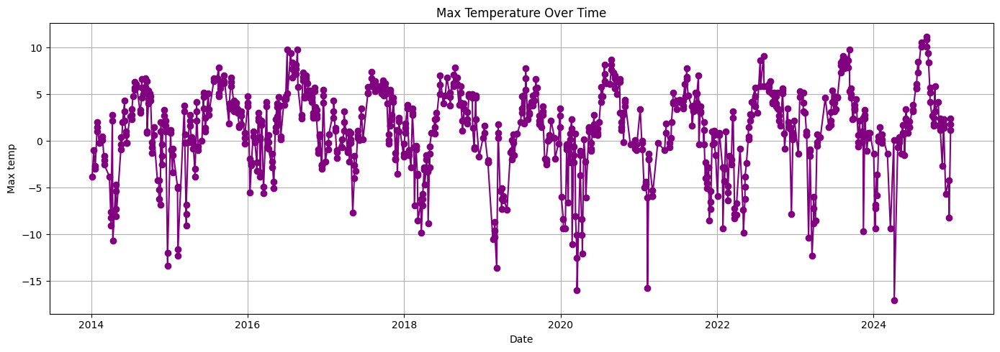

In [80]:
x = pd.to_datetime(results_df["time"]).to_numpy()
y = results_df["temperature_2m_max"].to_numpy()

plt.figure(figsize=(14, 5))
plt.plot(x, y, marker='o', linestyle='-', color='purple')
plt.title("Max Temperature Over Time")
plt.xlabel("Date")
plt.ylabel("Max temp")
plt.grid(True)
plt.tight_layout()
plt.savefig("plots/max_temp_time.png", dpi=300)
plt.show()

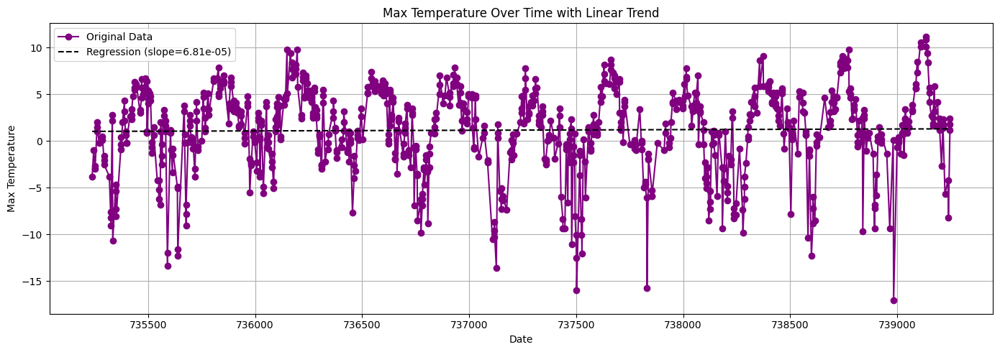

In [83]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

x_dates = pd.to_datetime(results_df["time"])
x_numeric = x_dates.map(datetime.toordinal).to_numpy().reshape(-1, 1)


y = results_df["temperature_2m_max"].to_numpy()

model = LinearRegression()
model.fit(x_numeric, y)


y_pred = model.predict(x_numeric)


plt.figure(figsize=(14, 5))
plt.plot(x_numeric, y, marker='o', linestyle='-', color='purple', label='Original Data')
plt.plot(x_numeric, y_pred, linestyle='--', color='black', label=f'Regression (slope={model.coef_[0]:.2e})')
plt.title("Max Temperature Over Time with Linear Trend")
plt.xlabel("Date")
plt.ylabel("Max Temperature")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("plots/max_temp_regression.png", dpi=300)
plt.show()


## 📚 References

1. **Radford, A., et al. (2021)**. *Learning Transferable Visual Models From Natural Language Supervision (CLIP)*.
   [https://arxiv.org/abs/2103.00020](https://arxiv.org/abs/2103.00020)

2. **Jia, C., et al. (2021)**. *Scaling Up Visual and Vision-Language Representation Learning With Noisy Text Supervision (ALIGN)*.
   [https://arxiv.org/abs/2102.05918](https://arxiv.org/abs/2102.05918)

3. **Kim, W., et al. (2021)**. *ViLT: Vision-and-Language Transformer Without Convolution or Region Supervision*.
   [https://arxiv.org/abs/2102.03334](https://arxiv.org/abs/2102.03334)

4. **Li, L. H., et al. (2019)**. *VisualBERT: A Simple and Performant Baseline for Vision and Language*.
   [https://arxiv.org/abs/1908.03557](https://arxiv.org/abs/1908.03557)

5. **Wang, W., et al. (2021)**. *SimVLM: Simple Visual Language Model Pretraining with Weak Supervision*.
   [https://arxiv.org/abs/2108.10904](https://arxiv.org/abs/2108.10904)

6. **Lihi Gur Arie, (2024)**. *Chat with Your Images using Multimodal LLMs*. [Towards Data Science Article Link](https://towardsdatascience.com/chat-with-your-images-using-multimodal-llms-60af003e8bfa/?sk=7c8e28ff04e5109ca98e185fef120675)

7. **Alayrac, J.-B., et al. (2022)**. *Flamingo: A Visual Language Model for Few-Shot Learning*.
   [https://arxiv.org/abs/2204.14198](https://arxiv.org/abs/2204.14198)

8. **OpenAI (2024)**. *GPT-4o Technical Report*.
   [https://openai.com/index/gpt-4o](https://openai.com/index/gpt-4o)

9. **Liu, H., et al. (2023)**. *Visual Instruction Tuning (LLaVA)*.
   [https://arxiv.org/abs/2304.08485](https://arxiv.org/abs/2304.08485)

10. **Zhang, Z., et al. (2023)**. *ConvLLaVA: Fine-Grained Grounding in High-Resolution Images with Convolutional Vision Encoders*.
    [https://arxiv.org/abs/2311.06395](https://arxiv.org/abs/2311.06395)

11. **DeepSeek-VL2 Team (2024)**. *DeepSeek-VL 2: Scaling Up Vision-Language Pretraining with Mixture-of-Experts*.
    [https://arxiv.org/abs/2403.16447](https://arxiv.org/abs/2403.16447)

12. **Jain, U., et al. (2022)**. *Multimodal contrastive learning for remote sensing tasks*. [https://arxiv.org/abs/2209.02329](https://arxiv.org/abs/2209.02329)

13. **Abhinav, A., et al. (2024)**. *Avalanche debris detection from Sentinel-2 data using fuzzy machine learning and colour spaces for the Indian Himalaya*. [https://www.tandfonline.com/doi/full/10.1080/2150704X.2025.2488532?src=exp-la](https://www.tandfonline.com/doi/full/10.1080/2150704X.2025.2488532?src=exp-la)

14. **Bonafilia, D., et al. (2020)**. *SEN12-FLOOD: A Georeferenced Dataset for Flood Detection Using Sentinel-1 and Sentinel-2*. 
    [https://www.mdpi.com/2072-4292/12/17/2757](https://www.mdpi.com/2072-4292/12/17/2757)

15. **Zhang, J., et al. (2021)**. *Multimodal Remote Sensing Benchmark Datasets for Land Cover Classification with Shared and Specific Feature Learning*. 
    [https://www.sciencedirect.com/science/article/pii/S1566253521000516](https://www.sciencedirect.com/science/article/pii/S1566253521000516)

